# 02 — trunk morph SMD, clustering and annotation

**Feeds:** Fig 4a, 4b, 4c, 4f · ED Fig 6a, 6b, 6d, 9a, 9b

**Position in the chain:** The April run: 5,306 cells x 199 genes x 18 clusters.

Ported from the original analysis. Saved cell outputs are from the original run, and paths in them appear as `<analysis-root>/...`.

**Changes from the original notebook**, so that it runs from this repository:
1. Paths. The first code cell finds the repository from any working directory inside it; the original looked for `src/` at most two levels up. `PROJECT_ROOT`, which was the analysis directory, is now `scrnaseq/chain_inputs/`, the shipped files that no notebook writes, in the same layout. `DEV_ROOT`, under which the notebook writes, is `$SCRNASEQ_RESULTS_ROOT/trunk_main_dev/` (default `scrnaseq/output/trunk_main_dev/`) instead of the analysis directory's `trunk_main_dev/`.
2. The SMD z-score files are read from `scrnaseq/chain_inputs/trunk_main_dev/results/smd_runs/` (`PROJECT_ROOT / "trunk_main_dev" / "results"`) instead of `RESULTS_DIR`, where they sat in the original analysis directory.
3. Removed the `.to_clipboard()` 2 calls, which copied tables to the system clipboard for pasting into the Supplementary Data spreadsheet and fail on a machine without a clipboard. The expression before each call is unchanged.

No other line of code was changed.


# 02 - Trunk Main Clustering

Depends on: `01_preprocessing` artifacts and dev trunk SMD runs in `<analysis-root>/trunk_main_dev/results/smd_runs/`.

Legacy coarse-trunk z-score alignment is intentionally handled here, not in `01_preprocessing`, so notebook `01` remains a pure preprocessing + SMD-input stage.

Current coarse clustering settings are promoted from the FOXA2-inclusive `leiden_ensemble` analysis: use the medoid raw run at `resolution=1.55` and `seed=5` from `<analysis-root>/leiden_ensemble/results/intermediates/02_trunk_main/scan/representative_run_selection.csv`.


In [ ]:
from pathlib import Path
import sys

for candidate in (Path.cwd(), *Path.cwd().parents):
    if (candidate / "src" / "trunk_morph_ref").exists():
        REPO_ROOT = candidate
        break
else:
    raise RuntimeError("Could not locate the repository root containing src/trunk_morph_ref/")

if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from src.trunk_morph_ref.paths import chain_inputs_root

# Inputs that no notebook writes: scrnaseq/chain_inputs/, laid out as the original analysis directory.
PROJECT_ROOT = chain_inputs_root(REPO_ROOT)

import os
os.chdir(REPO_ROOT)


## Setup and Imports
Configure paths, plotting defaults, helper functions, and load stage `01_preprocessing` intermediates.


In [ ]:
import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

In [ ]:
import pickle
import random

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import seaborn as sns
from cmcrameri.cm import batlow
from scipy.sparse import coo_matrix, csr_matrix, load_npz, save_npz

/opt/anaconda3/lib/python3.12/site-packages/scanpy/_utils/__init__.py:27: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  from anndata import __version__ as anndata_version


/opt/anaconda3/lib/python3.12/site-packages/anndata/__init__.py:70: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
/opt/anaconda3/lib/python3.12/site-packages/anndata/__init__.py:70: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
/opt/anaconda3/lib/python3.12/site-packages/anndata/__init__.py:70: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
/opt/anaconda3/lib/python3.12/site-packages/anndata/__init__.py:70: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  return module_get_attr_redirect(attr_name, deprecated_mapping=_DEPRECATED)
/opt/anaconda3

In [ ]:
plt.rcParams["svg.fonttype"] = "none"  # Keep fonts editable in Illustrator
NOTEBOOK_DPI = 110
EXPORT_DPI = 300
plt.rcParams["figure.dpi"] = EXPORT_DPI
plt.rcParams["savefig.dpi"] = EXPORT_DPI


In [ ]:
from src.trunk_morph_ref.cell_ordering import ordered_cells_by_cluster_clustermap
from src.trunk_morph_ref.paths import init_output_paths, scrnaseq_results_root

# Outputs: $SCRNASEQ_RESULTS_ROOT (default scrnaseq/output/), under trunk_main_dev/ as in the original.
DEV_ROOT = scrnaseq_results_root(REPO_ROOT) / "trunk_main_dev"
RESULTS_DIR, MANUSCRIPT_FIG_DIR, EXTENDED_FIG_DIR = init_output_paths(DEV_ROOT)
from src.trunk_morph_ref.aggregation import cluster_averages_sparse_safe
from src.trunk_morph_ref.correlation import gene_corrcoef_sparse_safe
from src.trunk_morph_ref.plotting import (
    bold_selected_heatmap_yticklabels,
    hide_heatmap_axes_and_colorbar,
    keep_only_selected_heatmap_yticklabels,
    plot_empty_heatmap_axes,
)
from src.trunk_morph_ref.preprocessing import (
    assert_gene_id_index,
    contains_symbol,
    ensure_gene_id_index,
)
from src.trunk_morph_ref.preprocessing import filter_genes_sparse_safe as filter_genes
from src.trunk_morph_ref.preprocessing import install_scanpy_symbol_defaults
from src.trunk_morph_ref.preprocessing import (
    normalize_unit_variance_sparse_safe as normalize_unit_variance,
)
from src.trunk_morph_ref.preprocessing import (
    resolve_symbol_dict,
    resolve_symbols,
    symbols_missing,
    symbols_present,
    var_names_to_symbols,
)

# Use gene symbols for plot labels while keeping `var_names` as stable gene IDs.
install_scanpy_symbol_defaults(sc)

In [ ]:
from src.trunk_morph_ref.pipeline_io import (
    load_h5ad,
    load_npy,
    load_pickle,
    save_h5ad,
    save_json,
    save_npy,
    save_pickle,
    stage_dir,
)

In [ ]:
pre_path = stage_dir(RESULTS_DIR, "01_preprocessing")
adata_morph_raw = load_h5ad(pre_path / "adata_morph_raw.h5ad")
adata_morph = load_h5ad(pre_path / "adata_morph.h5ad")
adata_morph_filtered = load_h5ad(pre_path / "adata_morph_filtered.h5ad")
adata_morph_nofilter = load_h5ad(pre_path / "adata_morph_nofilter.h5ad")
adata_embryo_raw = load_h5ad(pre_path / "adata_embryo_raw.h5ad")
adata_embryo = load_h5ad(pre_path / "adata_embryo.h5ad")
adata_embryo_filtered = load_h5ad(pre_path / "adata_embryo_filtered.h5ad")
adata_embryo_nofilter = load_h5ad(pre_path / "adata_embryo_nofilter.h5ad")
embryo_only_genes = load_pickle(pre_path / "embryo_only_genes.pkl")
morph_only_genes = load_pickle(pre_path / "morph_only_genes.pkl")
gene_order = list(load_npy(pre_path / "gene_order.npy"))

SMD_RUNS_DIR = PROJECT_ROOT / "trunk_main_dev" / "results" / "smd_runs"
trunk_smd_run_paths = {
    "001": SMD_RUNS_DIR / "trunk_morph__run001" / "z_trunk_morph__smd_input_001.npy",
    "002": SMD_RUNS_DIR / "trunk_morph__run002" / "z_trunk_morph__smd_input_002.npy",
    "007": SMD_RUNS_DIR / "trunk_morph__run007" / "z_trunk_morph__smd_input_007.npy",
    "008": SMD_RUNS_DIR / "trunk_morph__run008" / "z_trunk_morph__smd_input_008.npy",
    "009": SMD_RUNS_DIR / "trunk_morph__run009" / "z_trunk_morph__smd_input_009.npy",
}
trunk_smd_run_n_sub = {"001": 3000, "002": 4000, "007": 3500, "008": 4000, "009": 4250}
for run_id, path in trunk_smd_run_paths.items():
    if not path.exists():
        raise FileNotFoundError(f"Missing trunk SMD run {run_id}: {path}")

for _adata in [
    adata_morph_raw,
    adata_morph,
    adata_morph_filtered,
    adata_morph_nofilter,
    adata_embryo_raw,
    adata_embryo,
    adata_embryo_filtered,
    adata_embryo_nofilter,
]:
    ensure_gene_id_index(_adata)
    assert_gene_id_index(_adata)

# Ensure stage-01 morph QC filter is in effect for all downstream trunk analyses.
morph_qc_invariants = (
    (pd.to_numeric(adata_morph.obs["total_counts"], errors="coerce") >= 5000)
    & (pd.to_numeric(adata_morph.obs["n_genes_by_counts"], errors="coerce") >= 200)
    & (pd.to_numeric(adata_morph.obs["n_genes_by_counts"], errors="coerce") <= 10000)
    & (pd.to_numeric(adata_morph.obs["pct_counts_mt"], errors="coerce") <= 10.0)
)
assert bool(
    morph_qc_invariants.all()
), "adata_morph includes cells failing stage-01 QC invariants"
print(
    f"Loaded 01_preprocessing intermediates | morph cells after QC: {len(adata_morph)}"
)


Loaded 01_preprocessing intermediates | morph cells after QC: 5306


## Post-SMD processing and analysis
This section now separates run-to-run SMD comparison, on-the-fly reconstruction of the legacy morph z-score lookup, comparison to legacy SMD genes, SMD gene selection, and trunk clustering into distinct cells.

### Trunk SMD Run Comparison


  run_id  n_sub  n_genes_z_gt_2        max_z
0    001   3000             238  3767.874231
2    007   3500             235  3848.946799
1    002   4000             231  4055.847056
3    008   4000             232  3948.549260
4    009   4250             234  3816.124922

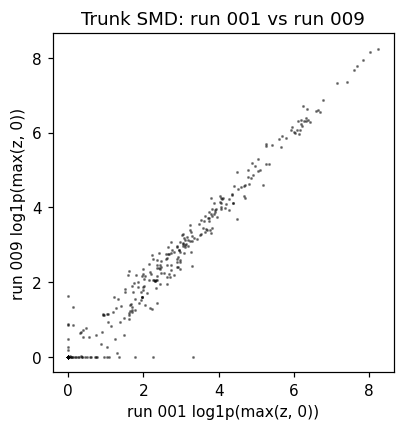

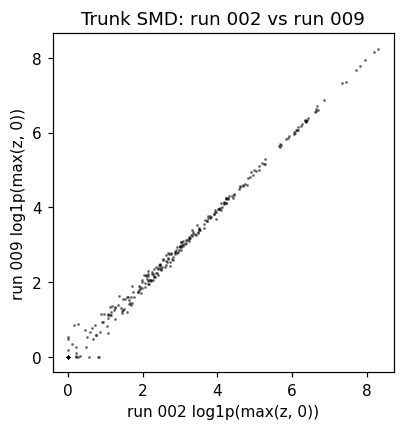

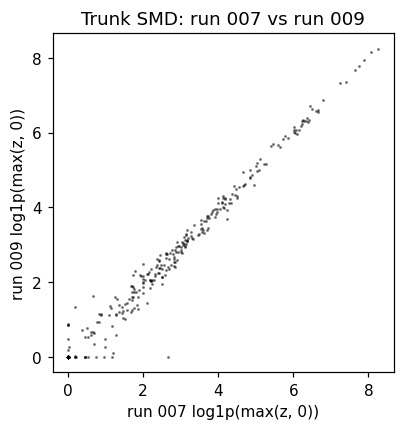

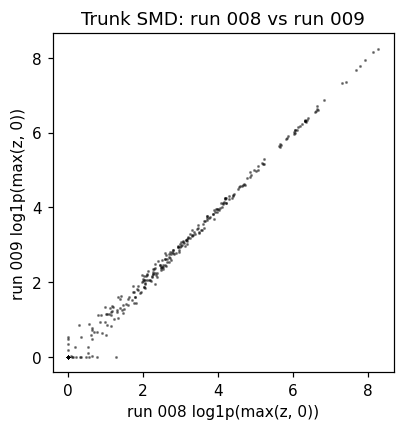

  reference_run selected_run  pearson_r     slope     intercept  \
0           001          009   0.996187  1.076079  1.471052e-16   
1           002          009   0.999773  0.958565 -3.581863e-16   
2           007          009   0.998448  1.032273  3.912763e-16   
3           008          009   0.999739  0.986144  7.261313e-16   

   z_gt_2_jaccard  
0        0.926531  
1        0.978723  
2        0.946058  
3        0.957983  

Using trunk SMD run 009 (n_sub=4250) for downstream trunk clustering.


In [ ]:
# Load completed trunk SMD runs from the dev experiment and compare them directly.
trunk_smd_runs = {run_id: np.load(path) for run_id, path in trunk_smd_run_paths.items()}
trunk_smd_run_order = sorted(trunk_smd_runs, key=int)
expected_n_genes = adata_morph_filtered.n_vars
for run_id, z_scores in trunk_smd_runs.items():
    if len(z_scores) != expected_n_genes:
        raise ValueError(
            f"Trunk SMD run {run_id} has {len(z_scores)} genes, expected {expected_n_genes}."
        )

trunk_smd_run_summary = pd.DataFrame(
    [
        {
            "run_id": run_id,
            "n_sub": trunk_smd_run_n_sub[run_id],
            "n_genes_z_gt_2": int((trunk_smd_runs[run_id] > 2).sum()),
            "max_z": float(trunk_smd_runs[run_id].max()),
        }
        for run_id in trunk_smd_run_order
    ]
).sort_values("n_sub")
display(trunk_smd_run_summary)

selected_trunk_smd_run = "009"
z_scores_morph = trunk_smd_runs[selected_trunk_smd_run]

comparison_rows = []
selected_gene_set = set(np.flatnonzero(z_scores_morph > 2))
for run_id in trunk_smd_run_order:
    if run_id == selected_trunk_smd_run:
        continue
    z_scores = trunk_smd_runs[run_id]
    linreg = scipy.stats.linregress(z_scores, z_scores_morph)
    current_gene_set = set(np.flatnonzero(z_scores > 2))
    union = selected_gene_set | current_gene_set
    comparison_rows.append(
        {
            "reference_run": run_id,
            "selected_run": selected_trunk_smd_run,
            "pearson_r": float(np.corrcoef(z_scores, z_scores_morph)[0, 1]),
            "slope": float(linreg.slope),
            "intercept": float(linreg.intercept),
            "z_gt_2_jaccard": float(
                len(selected_gene_set & current_gene_set) / len(union)
            ),
        }
    )
    with plt.rc_context({"figure.dpi": NOTEBOOK_DPI}):
        z_scores_plot = np.log1p(np.clip(z_scores, 0, None))
        z_scores_morph_plot = np.log1p(np.clip(z_scores_morph, 0, None))
        plt.figure(figsize=(4, 4))
        plt.plot(
            z_scores_plot,
            z_scores_morph_plot,
            "k.",
            markersize=2,
            alpha=0.4,
        )
        plt.xlabel(f"run {run_id} log1p(max(z, 0))")
        plt.ylabel(f"run {selected_trunk_smd_run} log1p(max(z, 0))")
        plt.title(f"Trunk SMD: run {run_id} vs run {selected_trunk_smd_run}")
        plt.show()

display(pd.DataFrame(comparison_rows))

print(
    f"Using trunk SMD run {selected_trunk_smd_run} "
    f"(n_sub={trunk_smd_run_n_sub[selected_trunk_smd_run]}) for downstream trunk clustering."
)


### Legacy SMD Gene Comparison


In [ ]:
# Reconstruct the legacy morph z-score lookup here so notebook 01 can remain pre-SMD only.
adata_morph_legacy_for_smd = adata_morph_raw.copy()
ensure_gene_id_index(adata_morph_legacy_for_smd)
assert_gene_id_index(adata_morph_legacy_for_smd)

legacy_minimum_reads = 5000
sc.pp.filter_cells(adata_morph_legacy_for_smd, min_counts=legacy_minimum_reads)
sc.pp.downsample_counts(
    adata_morph_legacy_for_smd,
    counts_per_cell=legacy_minimum_reads,
    replace=True,
    random_state=0,
)
sc.pp.log1p(adata_morph_legacy_for_smd)
adata_morph_legacy_for_smd = filter_genes(
    adata_morph_legacy_for_smd,
    mean_cutoff=0.05,
    std_cutoff=0.05,
    print_output=False,
)
adata_morph_legacy_for_smd = normalize_unit_variance(adata_morph_legacy_for_smd)
legacy_counts = adata_morph_legacy_for_smd.X
legacy_cv_mask = np.mean(legacy_counts, axis=0).transpose() < 1
adata_morph_legacy_for_smd = adata_morph_legacy_for_smd[:, legacy_cv_mask]

legacy_z_scores = np.load(PROJECT_ROOT / 'z_morph_2.12_000.npy')
if len(legacy_z_scores) != adata_morph_legacy_for_smd.n_vars:
    raise ValueError(
        f"z_morph_2.12_000.npy length ({len(legacy_z_scores)}) does not match "
        f"legacy filtered morph gene count ({adata_morph_legacy_for_smd.n_vars})."
    )

legacy_morph_smd_gene_scores = pd.DataFrame(
    {
        'gene_ids': adata_morph_legacy_for_smd.var_names.astype(str),
        'gene_symbol': adata_morph_legacy_for_smd.var['gene_symbol'].astype(str).to_numpy(),
        'gene_symbol_original': adata_morph_legacy_for_smd.var['gene_symbol_original']
        .astype(str)
        .to_numpy(),
        'z_score_SMD': legacy_z_scores,
    }
)
legacy_morph_smd_gene_scores['log1p_z_score_SMD'] = np.log1p(
    legacy_morph_smd_gene_scores['z_score_SMD']
)
legacy_morph_smd_gene_scores['gene_ids'] = legacy_morph_smd_gene_scores['gene_ids'].astype(str)
legacy_morph_smd_gene_scores = legacy_morph_smd_gene_scores.drop_duplicates(
    subset=['gene_ids'], keep='first'
)
legacy_z_by_gene_id = legacy_morph_smd_gene_scores.set_index('gene_ids')['z_score_SMD']
legacy_z_on_current = legacy_z_by_gene_id.reindex(
    adata_morph_filtered.var_names.astype(str)
)

selected_gene_ids = set(adata_morph_filtered.var_names[z_scores_morph > 2])
legacy_gene_ids = set(legacy_z_on_current[legacy_z_on_current > 2].index)
intersection_gene_ids = selected_gene_ids & legacy_gene_ids
union_gene_ids = selected_gene_ids | legacy_gene_ids

legacy_comparison_rows = []
for run_id in trunk_smd_run_order:
    run_gene_ids = set(adata_morph_filtered.var_names[trunk_smd_runs[run_id] > 2])
    run_intersection_gene_ids = run_gene_ids & legacy_gene_ids
    run_union_gene_ids = run_gene_ids | legacy_gene_ids
    legacy_comparison_rows.append(
        {
            'run_id': run_id,
            'is_selected': run_id == selected_trunk_smd_run,
            'n_sub': trunk_smd_run_n_sub[run_id],
            'run_z_gt_2': len(run_gene_ids),
            'legacy_z_gt_2': len(legacy_gene_ids),
            'intersection': len(run_intersection_gene_ids),
            'union': len(run_union_gene_ids),
            'jaccard': len(run_intersection_gene_ids) / len(run_union_gene_ids),
            'legacy_recall': len(run_intersection_gene_ids) / len(legacy_gene_ids),
            'precision_vs_legacy': len(run_intersection_gene_ids) / len(run_gene_ids),
        }
    )
legacy_comparison_summary = pd.DataFrame(legacy_comparison_rows).sort_values('n_sub')
display(legacy_comparison_summary)

gene_symbol_col = (
    'gene_symbol' if 'gene_symbol' in adata_morph_filtered.var.columns else None
)
comparison_run_ids = [
    run_id for run_id in trunk_smd_run_order if run_id != selected_trunk_smd_run
]


def gene_summary_table(gene_ids):
    rows = []
    for gene_id in sorted(gene_ids):
        gene_idx = adata_morph_filtered.var_names.get_loc(gene_id)
        row = {'gene_id': gene_id}
        if gene_symbol_col is not None:
            row['gene_symbol'] = adata_morph_filtered.var.loc[gene_id, gene_symbol_col]
        row['selected_z'] = float(z_scores_morph[gene_idx])
        row['legacy_z'] = float(legacy_z_by_gene_id.get(gene_id, np.nan))
        for run_id in comparison_run_ids:
            row[f'run_{run_id}_z'] = float(trunk_smd_runs[run_id][gene_idx])
        rows.append(row)
    return pd.DataFrame(rows)


legacy_only_genes = gene_summary_table(legacy_gene_ids - selected_gene_ids)
selected_only_genes = gene_summary_table(selected_gene_ids - legacy_gene_ids)

print(f"Legacy-only genes at z > 2: {len(legacy_only_genes)}")
display(legacy_only_genes)
print(f"Selected-run-only genes at z > 2: {len(selected_only_genes)}")
display(selected_only_genes)


/opt/anaconda3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


  run_id  is_selected  n_sub  run_z_gt_2  legacy_z_gt_2  intersection  union  \
0    001        False   3000         238            239           232    245   
2    007        False   3500         235            239           230    244   
1    002        False   4000         231            239           226    244   
3    008        False   4000         232            239           229    242   
4    009         True   4250         234            239           226    247   

    jaccard  legacy_recall  precision_vs_legacy  
0  0.946939       0.970711             0.974790  
2  0.942623       0.962343             0.978723  
1  0.926230       0.945607             0.978355  
3  0.946281       0.958159             0.987069  
4  0.914980       0.945607             0.965812  

Legacy-only genes at z > 2: 13


            gene_id gene_symbol  selected_z   legacy_z  run_001_z  run_002_z  \
0   ENSG00000021645       NRXN3    1.334344   2.757343   0.127758   1.065585   
1   ENSG00000033122       LRRC7    1.317024   2.091673  -1.284765   0.179551   
2   ENSG00000118257        NRP2    1.022574   3.238892   0.493352   0.577362   
3   ENSG00000118985        ELL2    1.143818   2.148326   0.593059   0.920926   
4   ENSG00000134215        VAV3   -0.986615  33.576453  26.483770   1.309696   
5   ENSG00000137573       SULF1    1.853962   2.955628   3.451341   1.933536   
6   ENSG00000144730      IL17RD    0.624200   3.111423   2.470884   0.957091   
7   ENSG00000149972       CNTN5    0.935971   3.720440   1.473809   1.327778   
8   ENSG00000152082       MZT2B    0.814726   2.148326   3.368251   1.137914   
9   ENSG00000169071        ROR2   -0.796088   2.063346   1.806167  -0.245384   
10  ENSG00000204442     FAM155A    0.000659   4.357784   4.996807   1.237367   
11  ENSG00000213719       CLIC1    1.732

Selected-run-only genes at z > 2: 8


           gene_id gene_symbol  selected_z  legacy_z  run_001_z  run_002_z  \
0  ENSG00000106333      PCOLCE    2.061809  1.964204   1.590134   2.042030   
1  ENSG00000122691      TWIST1    2.754633  1.581798   0.127758   2.042030   
2  ENSG00000126733       DACH2    2.425541  1.341024   4.215765   3.244505   
3  ENSG00000144749       LRIG1    2.113771  1.652614   1.822785   1.915454   
4  ENSG00000164109      MAD2L1    2.079130  1.156902   1.523662   2.159566   
5  ENSG00000170312        CDK1    3.759227  1.794246   4.880481   3.606152   
6  ENSG00000178035      IMPDH2    2.148412 -0.089459   1.872639   1.617096   
7  ENSG00000228222  AC073050.1    2.183053  1.029433   1.540280   1.427231   

   run_007_z  run_008_z  
0   1.964093   1.404039  
1   0.199220   1.667698  
2   3.304718   2.230169  
3   1.404085   1.825893  
4   1.404085   1.228267  
5   4.068365   3.952739  
6   1.268326   1.720429  
7   2.608951   1.948934  

### Trunk SMD Gene Selection


/var/folders/l_/r6wv9rf56fb1h8jjvhh7rl440000gp/T/ipykernel_34979/1929882457.py:2: RuntimeWarning: invalid value encountered in log1p
  adata_morph_filtered.var["log1p_z_score_SMD"] = np.log1p(z_scores_morph)


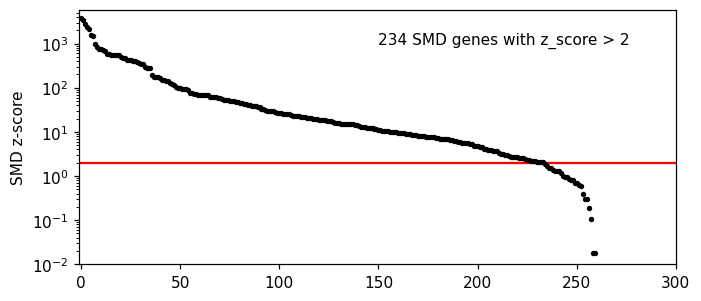

234 morph genes selected with top SMD z-scores > 2


In [ ]:
adata_morph_filtered.var["z_score_SMD"] = z_scores_morph
adata_morph_filtered.var["log1p_z_score_SMD"] = np.log1p(z_scores_morph)
adata_morph_filtered.uns["smd_run_id"] = selected_trunk_smd_run
adata_morph_filtered.uns["smd_run_n_sub"] = trunk_smd_run_n_sub[selected_trunk_smd_run]
morph_z_threshold = 2.0

with plt.rc_context({"figure.dpi": NOTEBOOK_DPI}):
    # Plot top SMD z-scores
    plt.figure(figsize=(7, 3))
    plt.hlines(morph_z_threshold, -1, 2000, "r")
    plt.plot(sorted(adata_morph_filtered.var["z_score_SMD"])[::-1], "k.", markersize=5)
    plt.yscale("log")
    plt.ylim(0.01, 1.5 * adata_morph_filtered.var["z_score_SMD"].max())
    plt.xlim(-1, 300)
    plt.ylabel("SMD z-score")
    plt.text(
        150,
        1000,
        f"{(adata_morph_filtered.var['z_score_SMD'] > morph_z_threshold).sum()} SMD genes with z_score > {morph_z_threshold:g}",
    )
    plt.show()

adata_morph_filtered_ = adata_morph_filtered.copy()
adata_morph_SMD = adata_morph_filtered_[
    :, adata_morph_filtered_.var["z_score_SMD"] > morph_z_threshold
]

print(
    str(len(adata_morph_SMD.var))
    + f" morph genes selected with top SMD z-scores > {morph_z_threshold:g}"
)

# Manual gene curation: add low-frequency marker genes and remove selected lncRNAs.
# Current promoted dev configuration keeps NOTO and additionally includes FOXA2 before coarse clustering.
morph_manual_smd_genes = [
    "TBXT",
    "MSGN1",
    "RIPPLY1",
    "NOTO",
    "FOXA2",
]
morph_manual_remove_genes = ["SNHG3", "SNHG19"]  # lncRNAs with undescribed function
morph_manual_add_ids = resolve_symbols(
    adata_morph,
    morph_manual_smd_genes,
    strict=False,
    allow_missing=True,
)

# Add manually curated marker genes after resolving symbols to gene IDs.
adata_morph_SMD = ad.concat(
    [
        adata_morph_SMD,
        adata_morph[:, morph_manual_add_ids],
    ],
    axis=1,
    join="outer",
)

# Resolve remove-list symbols to gene IDs so filtering uses the stable index.
morph_manual_remove_ids = set(
    resolve_symbols(
        adata_morph_SMD,
        morph_manual_remove_genes,
        strict=False,
        allow_missing=True,
    )
)
adata_morph_SMD = adata_morph_SMD[
    :, [g for g in adata_morph_SMD.var_names if g not in morph_manual_remove_ids]
]

# Remove cell-cycle genes before graph construction and clustering
genes_cellcycle = [
    "MKI67",
    "CENPE",
    "SGO2",
    "KIF14",
    "PIF1",
    "NDC80",
    "CDCA8",
    "PLK1",
    "AURKA",
    "UBE2C",
    "ASPM",
    "TOP2A",
    "TPX2",
    "NUSAP1",
    "CDC20",
    "CKS2",
    "KPNA2",
    "TUBB4B",
    "DLGAP5",
    "BIRC5",
    "HMMR",
    "CCNB1",
    "ARL6IP1",
    "PTTG1",
    "UBE2S",
    "DUT",
    "HELLS",
    "CLSPN",
    "RRM2",
    "PCLAF",
    "TYMS",
    "KIF18B",
    "SMC4",
    "HIST1H4C",
    "DIAPH3",
    "RFC3",
    "MIR924HG",
    "MIS18BP1",
    "TUBA1C",
    "CDK1",
    "CENPA",
]

# Resolve cell-cycle symbols to gene IDs before dropping them from clustering features.
cellcycle_gene_ids = set(
    resolve_symbols(adata_morph_SMD, genes_cellcycle, strict=False, allow_missing=True)
)
keep_genes_morph = [
    i
    for i in range(len(adata_morph_SMD.var_names))
    if adata_morph_SMD.var_names[i] not in cellcycle_gene_ids
]
adata_morph_SMD = adata_morph_SMD[:, keep_genes_morph]


### Trunk SMD Gene-Gene Correlation


In [ ]:
corr_gg_morph = gene_corrcoef_sparse_safe(adata_morph_SMD.X)

with plt.rc_context({"figure.dpi": NOTEBOOK_DPI}):
    cluster_gg_morph = sns.clustermap(
        corr_gg_morph,
        method="ward",
        metric="euclidean",
        figsize=(30, 30),
        cmap="seismic",
        vmin=-1,
        vmax=1,
        yticklabels=var_names_to_symbols(adata_morph_SMD),
        xticklabels=var_names_to_symbols(adata_morph_SMD),
    )

### Supp. Data 1 - SMD Z-scores


In [ ]:
# For copy-paste into excel spreadsheet
# Supplementary Data 1, "Gene markers and differential expression supporting trunk morph cell type annotations"
# Sheet 2, "SMD Z-scores"
# Columns A-B "Trunk Morph Clustering"
adata_morph_SMD.var["z_score_SMD"].sort_values(ascending=False)

### Trunk Clustering


In [ ]:
# Build graph, run UMAP/Leiden, transfer labels, and apply endothelial correction
adata_morph_SMD_ = adata_morph_SMD.copy()
sc.pp.normalize_total(adata_morph_SMD_)
try:
    sc.pp.neighbors(adata_morph_SMD_, use_rep="X")
except:
    sc.pp.neighbors(adata_morph_SMD_, use_rep="X")
sc.tl.umap(adata_morph_SMD_, random_state=5)

# Leiden clustering promoted from the FOXA2-inclusive leiden_ensemble medoid run.
sc.tl.leiden(
    adata_morph_SMD_,
    resolution=1.55,
    random_state=5,
    key_added="leiden_morph",
    flavor="igraph",
    n_iterations=-1,
)

# Manual cluster-ID -> label assignment for the 1.55 / seed 5 representative run.
# IDs were taken from the medoid raw run selected by mean ARI in the FOXA2-inclusive ensemble sweep.
celltypes_morph = {
    "0": "Roof Plate",
    "1": "Hindbrain",
    "2": "Intermediate-Ventral Spinal Cord",
    "3": "Dorsal Spinal Cord",
    "4": "Neural Crest",
    "5": "Mature Somite",
    "6": "Intermediate Mesoderm",
    "7": "Posterior Neural Tube",
    "8": "Forebrain / Midbrain",
    "9": "Non-Neural Ectoderm",
    "10": "Lateral Plate Mesoderm",
    "11": "Neuromesodermal Progenitors",
    "12": "Notochord / Floor Plate",
    "13": "Immature Neuron",
    "14": "Early Somite",
    "15": "Presomitic Mesoderm",
}

adata_morph_SMD_.obs["leiden_morph"] = adata_morph_SMD_.obs[
    "leiden_morph"
].cat.rename_categories(celltypes_morph)

# Copy cluster IDs to adata with all genes
adata_morph_with_clusters = adata_morph.copy()
adata_morph_with_clusters.obs["leiden_morph"] = adata_morph_SMD_.obs["leiden_morph"]


/opt/anaconda3/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:423: FutureWarning: Use obsm (e.g. `k in adata.obsm` or `adata.obsm.keys() | {'u'}`) instead of AnnData.obsm_keys, AnnData.obsm_keys is deprecated and will be removed in the future.
  if "X_diffmap" in adata.obsm_keys():


### Trunk Cluster-Cluster Correlation


In [ ]:
# Manual coarse relabels used for current figure generation.
lpm_endothelial_cell_ids = [
    "TACGGTACAACACAGG-1",
    "ATCGGCGGTAGGGAGG-1",
    "ACGCACGTCTTAGCAG-1",
    "CTATCTAAGTTCCATG-1",
    "GCATTAGAGAAATTGC-1",
]

floor_plate_cell_ids = [
    "GGTGATTAGTAGACAT-1",
    "ACATTTCTCGAGAAGC-1",
    "AAGATAGAGAATACAC-1",
    "AACCTGACAAGTATCC-1",
    "ACCTGAAGTATACGGG-1",
    "CCGGACATCTTACTGT-1",
    "GGGAGATGTCTGCATA-1",
    "ACTGTCCCACTGTCGG-1",
    "ATACTTCTCTCAGGCG-1",
    "TCACTATGTTAGGCCC-1",
    "GTGAGCCTCTTGTTAC-1",
    "TTCCGTGAGGAACGCT-1",
    "TTGGATGGTCTGCAAT-1",
    "CACGGGTGTCCACAGC-1",
    "AGATCGTTCGAAGTGG-1",
    "CGATGCGCACTGGAAG-1",
    "CAGTTAGGTTAAACAG-1",
    "GAAACCTCAAATGAAC-1",
    "GTTACGATCCATACTT-1",
]

for _adata in [adata_morph_with_clusters, adata_morph_SMD_]:
    morph_labels = _adata.obs["leiden_morph"].astype(str).copy()
    morph_labels.loc[morph_labels == "Notochord / Floor Plate"] = "Notochord"
    morph_labels.loc[floor_plate_cell_ids] = "Floor Plate"
    morph_labels.loc[lpm_endothelial_cell_ids] = "Endothelial"
    _adata.obs["leiden_morph"] = morph_labels

celltypeorder = [
    "Forebrain / Midbrain",
    "Hindbrain",
    "Intermediate-Ventral Spinal Cord",
    "Dorsal Spinal Cord",
    "Roof Plate",
    "Neural Crest",
    "Immature Neuron",
    "Posterior Neural Tube",
    "Neuromesodermal Progenitors",
    "Floor Plate",
    "Notochord",
    "Presomitic Mesoderm",
    "Early Somite",
    "Mature Somite",
    "Intermediate Mesoderm",
    "Lateral Plate Mesoderm",
    "Endothelial",
    "Non-Neural Ectoderm",
]

present_morph_labels = sorted(
    set(adata_morph_with_clusters.obs["leiden_morph"].astype(str))
    | set(adata_morph_SMD_.obs["leiden_morph"].astype(str))
)
extra_morph_labels = [
    label for label in present_morph_labels if label not in celltypeorder
]
ordered_morph_categories = celltypeorder + extra_morph_labels
if extra_morph_labels:
    print(
        "Found morph cluster labels outside celltypeorder; appending to category order:",
        extra_morph_labels,
    )

adata_morph_with_clusters.obs["leiden_morph"] = pd.Categorical(
    adata_morph_with_clusters.obs["leiden_morph"].astype(str),
    categories=ordered_morph_categories,
    ordered=True,
)

adata_morph_SMD_.obs["leiden_morph"] = pd.Categorical(
    adata_morph_SMD_.obs["leiden_morph"].astype(str),
    categories=ordered_morph_categories,
    ordered=True,
)

adata_morph_SMD_leiden = sc.get.aggregate(
    adata_morph_SMD_,
    by="leiden_morph",
    func=["count_nonzero", "mean", "sum", "var"],
    axis="obs",
)

corr_clcl_morph = np.corrcoef(adata_morph_SMD_leiden.layers["mean"])

with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    cluster_clcl_morph = sns.clustermap(
        corr_clcl_morph,
        method="ward",
        metric="euclidean",
        figsize=(10, 10),
        cmap="seismic",
        vmin=-1,
        vmax=1,
        yticklabels=adata_morph_SMD_leiden.obs.leiden_morph.cat.categories,
        xticklabels=adata_morph_SMD_leiden.obs.leiden_morph.cat.categories,
    )
    cluster_clcl_morph.fig.suptitle(
        "Cluster-cluster mean gene correlation among all expressed genes"
    )

adata_morph_SMD_ = adata_morph_SMD_[
    adata_morph_SMD_.obs.sort_values("leiden_morph").index, :
]
adata_morph_with_clusters = adata_morph_with_clusters[
    adata_morph_with_clusters.obs.sort_values("leiden_morph").index, :
]


## ED Fig. 9 - Morphogen and receptor gene expression


In [ ]:
secreted_morphogens = [  # BMP subfamily (TGF-β superfamily)
    "BMP2",
    "BMP3",
    "BMP4",
    "BMP5",
    "BMP6",
    "BMP7",
    "BMP8A",
    "BMP8B",
    "BMP10",
    # "BMP15", # not expressed in dataset
    # Activin/Nodal/GDF subfamily (TGF-β superfamily)
    "NODAL",
    "INHBA",
    "INHBB",
    "INHBC",
    "INHBE",
    "LEFTY1",
    "LEFTY2",
    # "GDF1", # not expressed in dataset
    # "GDF3", # not expressed in dataset
    "GDF5",
    "GDF6",
    "GDF7",
    "GDF9",
    "GDF11",
    "GDF15",
    # TGF-β ligands
    "TGFB1",
    "TGFB2",
    "TGFB3",
    # WNT family
    "WNT1",
    "WNT2",
    "WNT2B",
    "WNT3",
    "WNT3A",
    "WNT4",
    "WNT5A",
    "WNT5B",
    "WNT6",
    "WNT7A",
    "WNT7B",
    "WNT8A",
    "WNT8B",
    "WNT9A",
    "WNT9B",
    # "WNT10A", # not expressed in dataset
    "WNT10B",
    "WNT11",
    # "WNT16", # not expressed in dataset
    # RSPO (R-spondins) – potentiate Wnt signaling
    "RSPO1",
    "RSPO2",
    "RSPO3",
    "RSPO4",
    # Hedgehog family
    "SHH",
    "IHH",
    "DHH",
    # FGF family (secreted ligands with morphogen-like activity in some contexts)
    "FGF1",
    "FGF2",
    "FGF3",
    "FGF4",
    "FGF5",
    "FGF8",
    "FGF9",
    "FGF10",
    "FGF17",
    "FGF18",
    # Other secreted modulators with morphogen-like activity
    "DLK1",  # Notch ligand with secreted isoform, regulates neurogenesis and adipogenesis
    "EGF",  # Broad growth factor with morphogen-like roles in epithelial patterning
    "MDK",  # Midkine, neurotrophic and patterning activity
    "FGF19",
    # "FGF21", # not expressed in dataset
    "FGF23",  # Endocrine FGFs with morphogen activity in liver/gut/bone
    # VEGF family
    "VEGFA",
    "VEGFB",
    "VEGFC",
    "VEGFD",
    "PGF",
]

In [ ]:
# Reorder cells (within each cluster) by ward hierarchical clustering
# This makes possible substructure within clusters clearer by positioning "similar" cells in nearby columns
adata_morph_heatmap_ordered = adata_morph_with_clusters[:].copy()
trunk_cell_order = ordered_cells_by_cluster_clustermap(
    adata=adata_morph_heatmap_ordered,
    cluster_key="leiden_morph",
    var_names=secreted_morphogens,
    figsize=(5, 5),
    vmin=0,
    vmax=5,
    cmap=batlow,
    method="ward",
    metric="euclidean",
)

In [ ]:
adata_morph_heatmap_ordered = adata_morph_heatmap_ordered[trunk_cell_order, :].copy()

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        secreted_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        show=False,
    )

    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig9a_heatmap_allmorphogens.png",
        bbox_inches="tight",
        pad_inches=0,
    )

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        secreted_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        show=False,
    )
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig9a_heatmap_allmorphogens.png",
        bbox_inches="tight",
        pad_inches=0,
    )

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


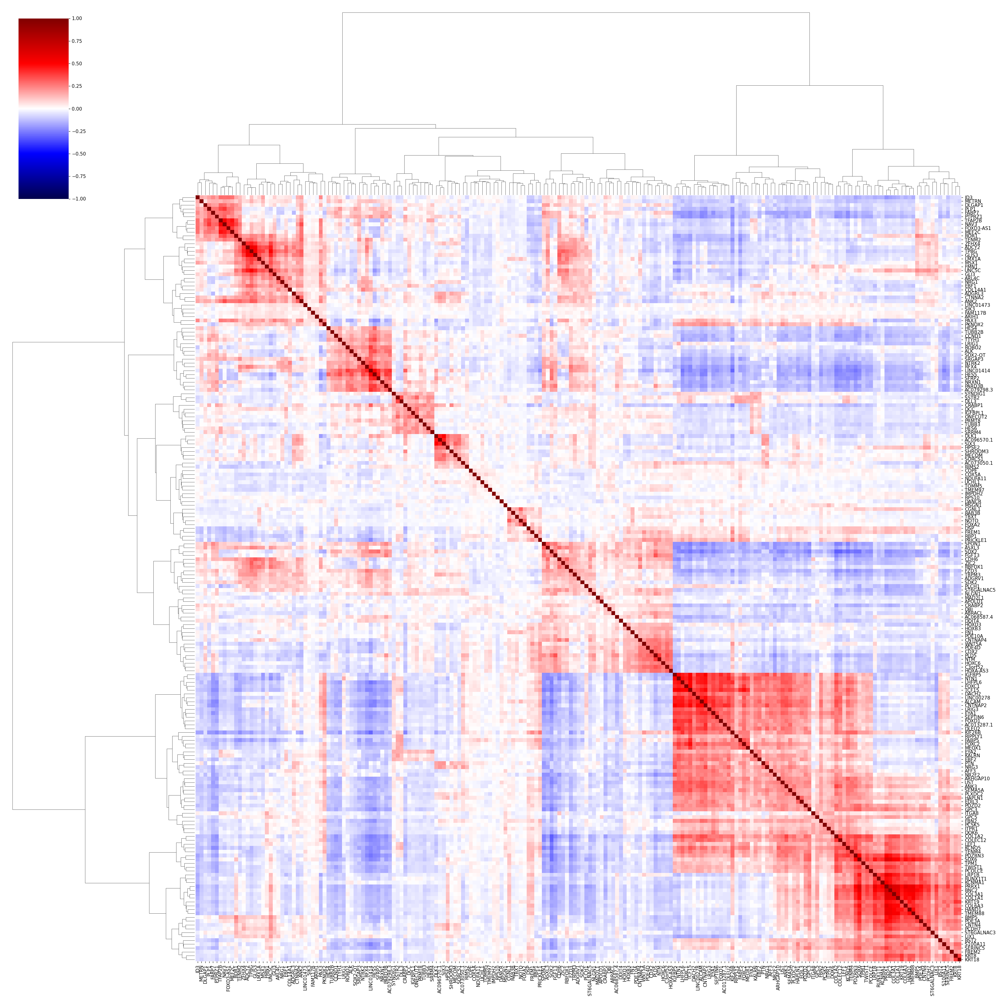

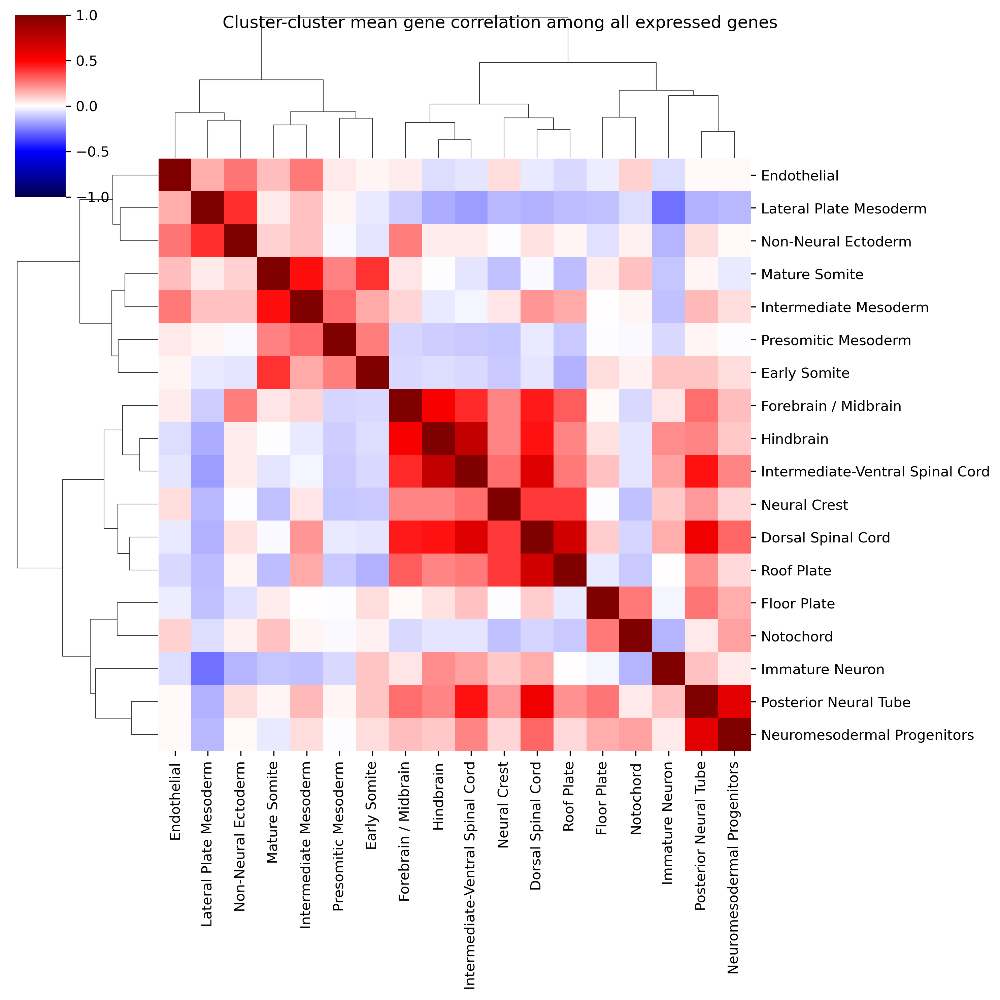

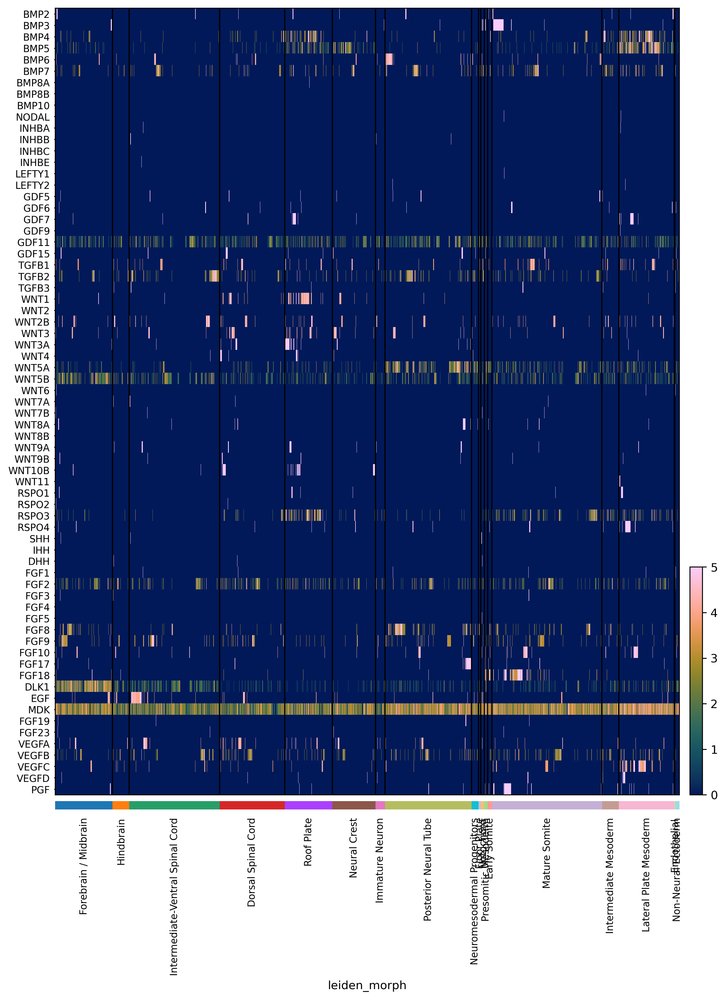

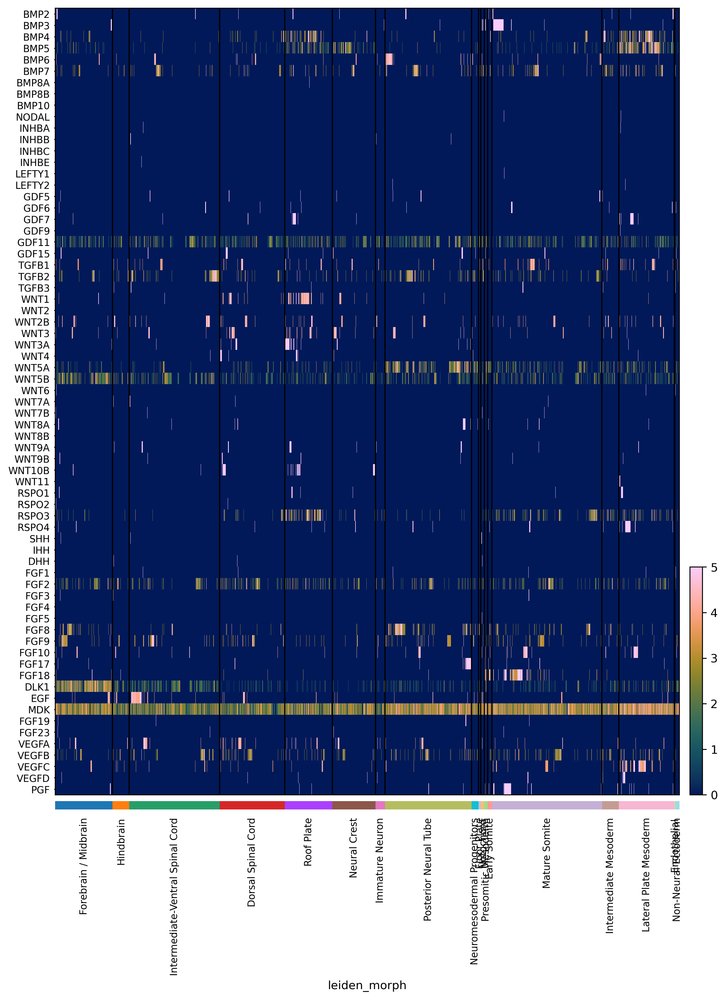

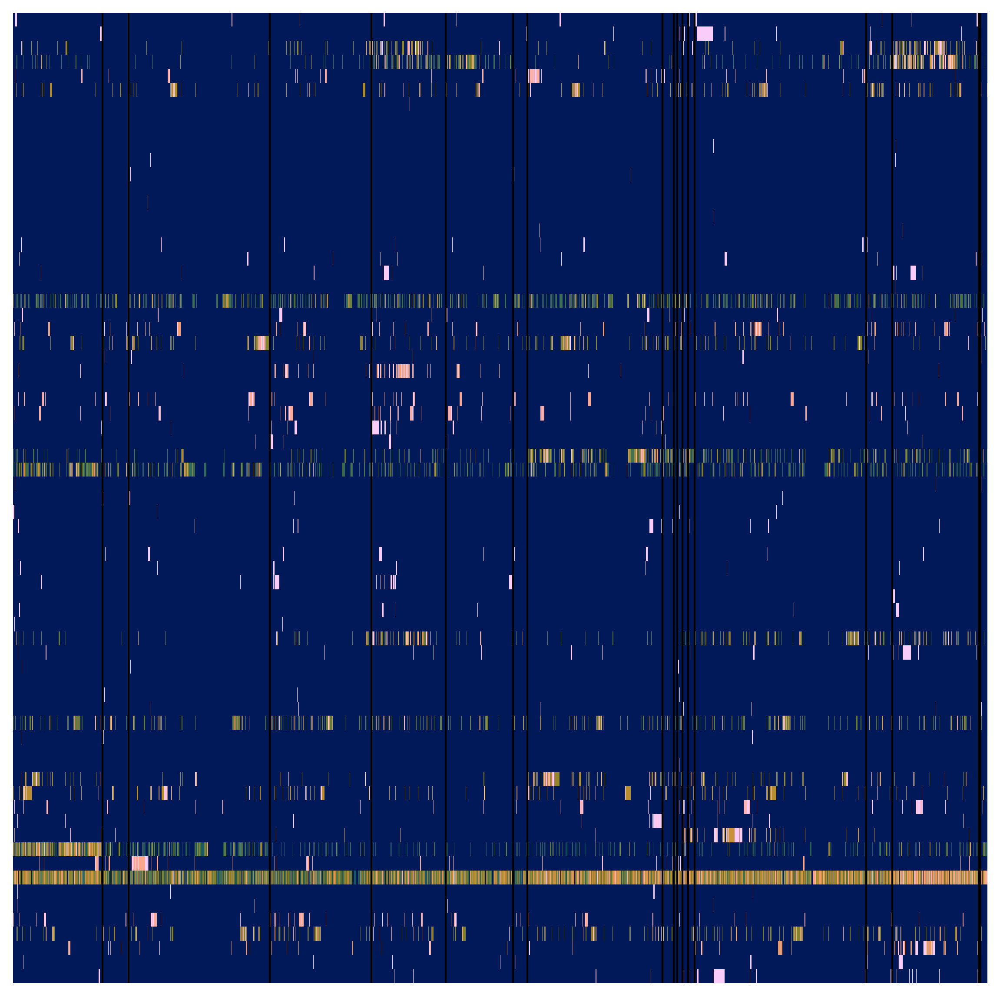

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        secreted_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        figsize=(10, 10),
        show=False,
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig9a_heatmap_allmorphogens_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


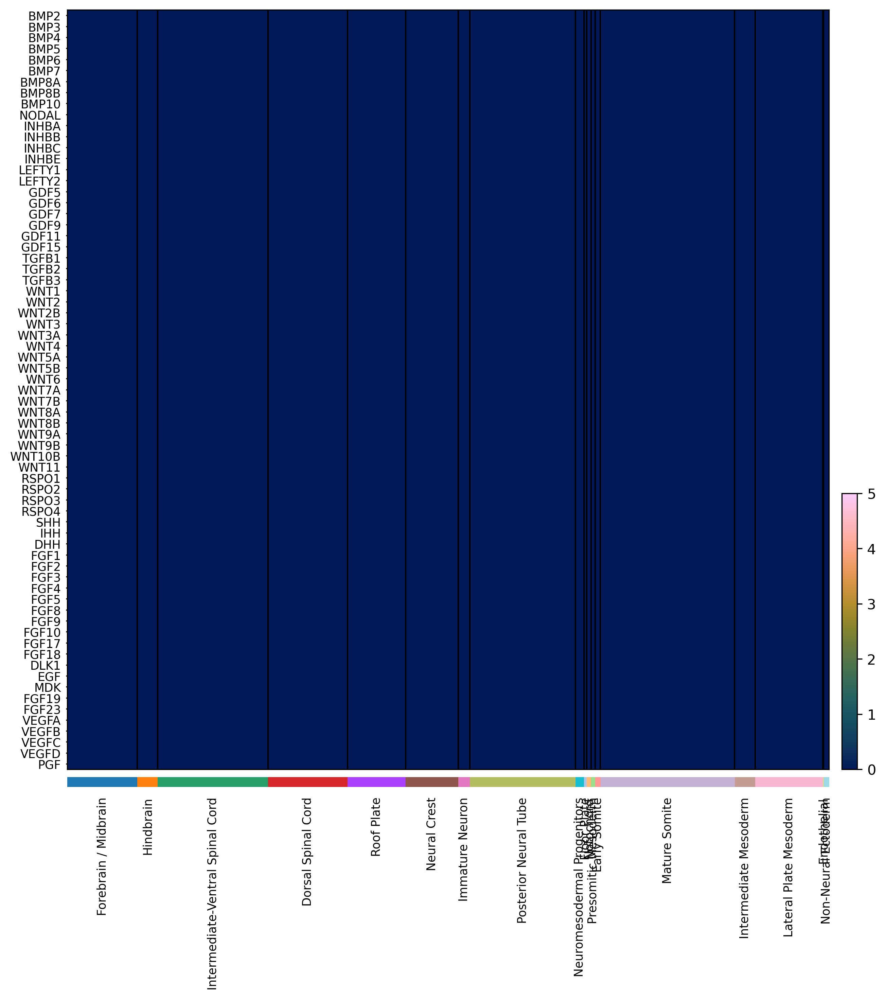

In [ ]:
ax = plot_empty_heatmap_axes(
    adata_morph_heatmap_ordered,
    var_names=secreted_morphogens,
    groupby="leiden_morph",
    swap_axes=True,
    show_gene_labels=True,
    vmin=0,
    vmax=5,
    cmap=batlow,
    figsize=(10, 10),
    show=False,
)

ax["groupby_ax"].set_xlabel("")

# Export as SVG
plt.savefig(
    f"{EXTENDED_FIG_DIR}/EDFig9a_heatmap_allmorphogens_axesonly.svg",
    bbox_inches="tight",
    format="svg",
    dpi=300,
)
plt.show()

In [ ]:
with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    sc.pl.stacked_violin(
        adata_morph_with_clusters,
        ["BMPR1A", "BMPR1B", "BMPR2", "ACVR1"],
        groupby=["leiden_morph"],
        swap_axes=True,
        cmap="Reds",
        show=False,
        # save="BMPreceptor.pdf",
    )

    # Export as PDF
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig9b_violin_bmp_receptors.pdf",
        bbox_inches="tight",
        format="pdf",
        dpi=300,
    )

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


## Fig. 4f - LPM morphogen gene expression


In [ ]:
lpm_morphogens = [
    "BMP4",
    "BMP5",
    "BMP7",
    "GDF7",
    "GDF11",
    "TGFB1",
    "WNT5A",
    "WNT5B",
    "RSPO3",
    "RSPO4",
    "FGF10",
    "DLK1",
    "VEGFB",
    "VEGFC",
]

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        lpm_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        figsize=(10, 3),
        show=False,
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4f_heatmap_LPMmorphogens.png",
        bbox_inches="tight",
        pad_inches=0,
    )

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        lpm_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        figsize=(10, 3),
        show=False,
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4f_heatmap_LPMmorphogens.png",
        bbox_inches="tight",
        pad_inches=0,
    )

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


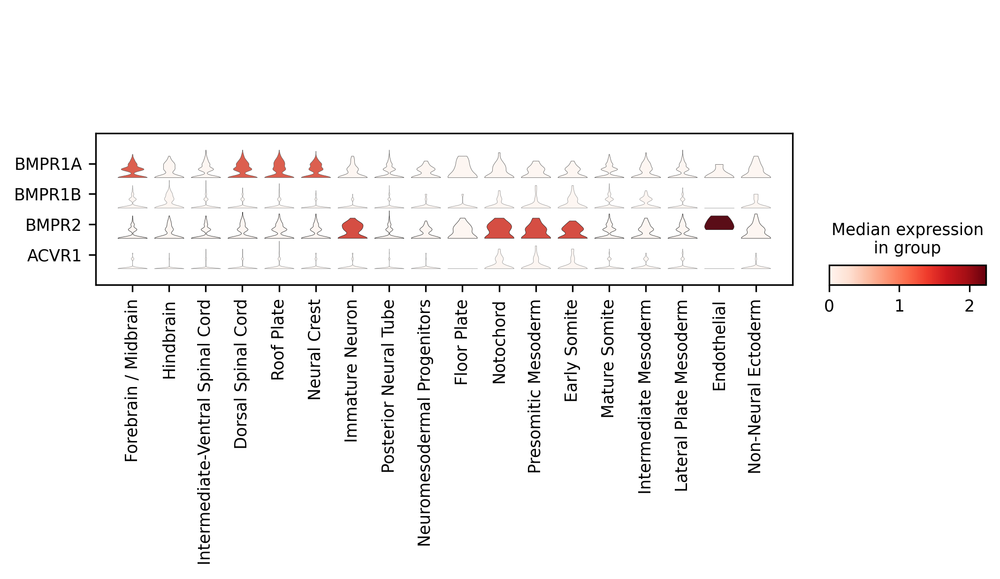

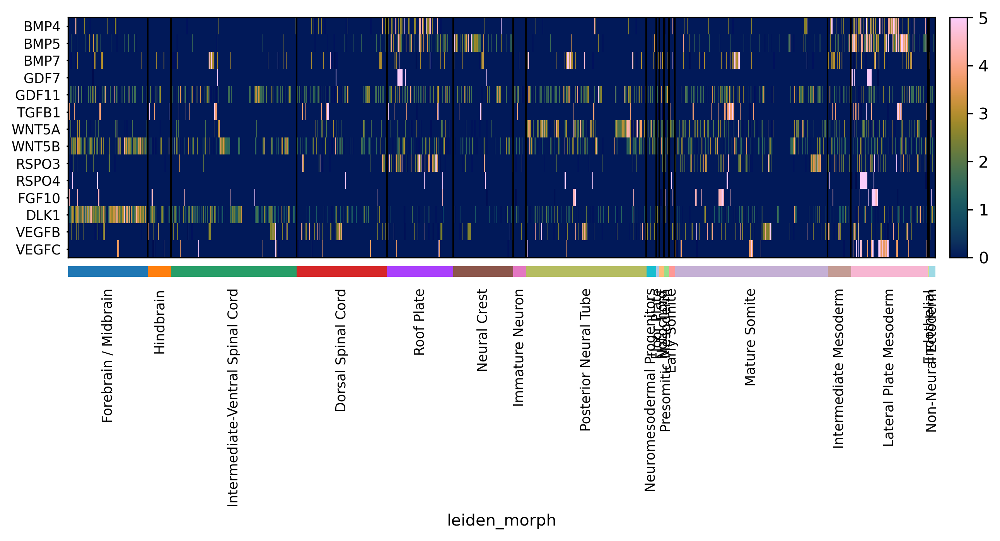

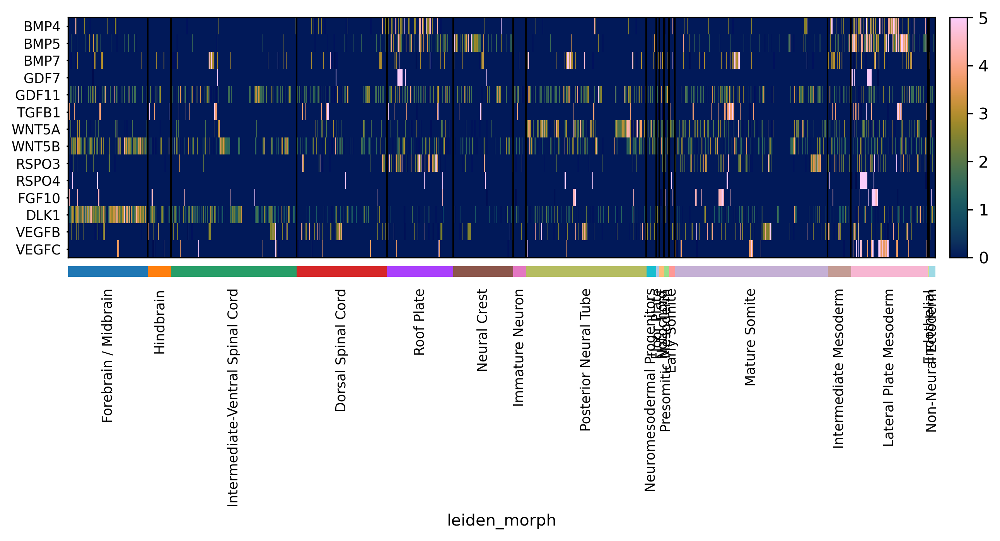

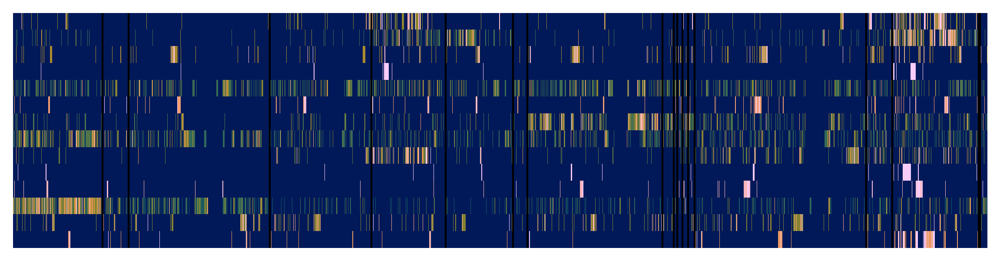

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_heatmap_ordered,
        lpm_morphogens,
        groupby="leiden_morph",
        cmap=batlow,
        vmin=0,
        vmax=5,
        show_gene_labels=True,
        swap_axes=True,
        # figsize=(10,3),
        show=False,
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4f_heatmap_LPMmorphogens_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


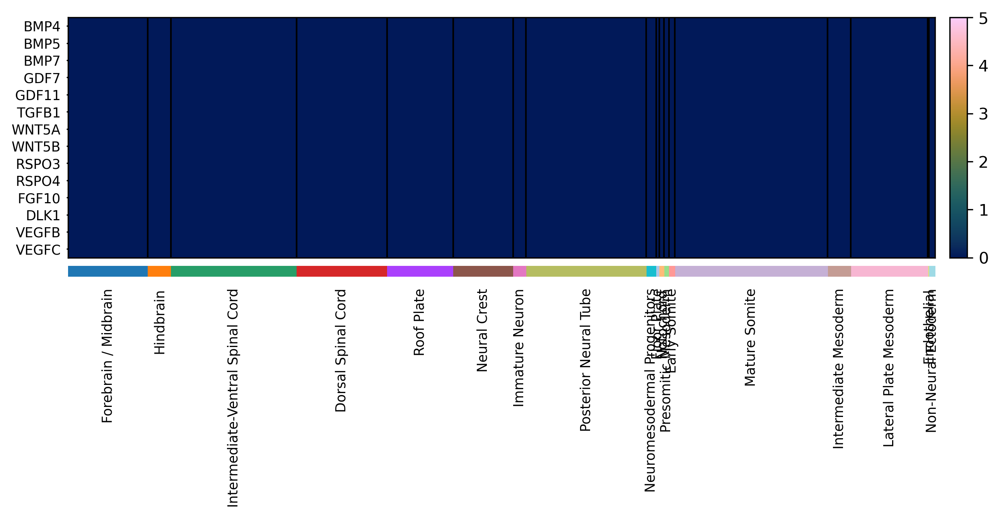

In [ ]:
ax = plot_empty_heatmap_axes(
    adata_morph_heatmap_ordered,
    var_names=lpm_morphogens,
    groupby="leiden_morph",
    swap_axes=True,
    show_gene_labels=True,
    vmin=0,
    vmax=5,
    cmap=batlow,
    figsize=(10, 3),
    show=False,
)

ax["groupby_ax"].set_xlabel("")

# Export as SVG
plt.savefig(
    f"{MANUSCRIPT_FIG_DIR}/Fig4f_heatmap_LPMmorphogens_axesonly.svg",
    bbox_inches="tight",
    format="svg",
    dpi=300,
)
plt.show()

## Fig. 4g - NMP morphogen gene expression


In [ ]:
nmp_morphogens = [
    "WNT8A",
    "FGF17",
    "FGF8",
    "WNT3A",
    "FGF9",
    "WNT5A",
]

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    dp = sc.pl.dotplot(
        adata_morph_heatmap_ordered,
        nmp_morphogens,
        groupby="leiden_morph",
        categories_order=celltypeorder,
        swap_axes=True,
        standard_scale="var",
        cmap=batlow,
        dot_max=0.65,
        dot_min=0.0,
        smallest_dot=5,
        figsize=(10.5, 2.8),
        show=False,
        return_fig=True,
    )
    dp.style(cmap=batlow, dot_edge_color="black", dot_edge_lw=0.25)
    dp.make_figure()
    fig = dp.fig

    fig.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens.png",
        bbox_inches="tight",
        format="png",
        dpi=300,
    )
    fig.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens.pdf",
        bbox_inches="tight",
        format="pdf",
        dpi=300,
    )
    fig.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens.svg",
        bbox_inches="tight",
        format="svg",
        dpi=300,
    )
    plt.close(fig)

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    dp = sc.pl.dotplot(
        adata_morph_heatmap_ordered,
        nmp_morphogens,
        groupby="leiden_morph",
        categories_order=celltypeorder,
        swap_axes=True,
        standard_scale="var",
        cmap=batlow,
        dot_max=0.65,
        dot_min=0.0,
        smallest_dot=5,
        show=False,
        return_fig=True,
    )
    dp.style(cmap=batlow, dot_edge_color="black", dot_edge_lw=0.25)
    dp.make_figure()
    fig = dp.fig

    for ax in fig.axes:
        if ax.get_ylabel() == "Mean expression\nin group":
            ax.set_visible(False)
        elif ax.get_ylabel() == "Fraction of cells\nin group (%)":
            ax.set_visible(False)
        else:
            ax.set_axis_off()

    fig.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens_noaxes.png",
        bbox_inches="tight",
        format="png",
        dpi=300,
    )
    plt.close(fig)

In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    dp = sc.pl.dotplot(
        adata_morph_heatmap_ordered,
        nmp_morphogens,
        groupby="leiden_morph",
        categories_order=celltypeorder,
        swap_axes=True,
        standard_scale="var",
        cmap=batlow,
        dot_max=0.65,
        dot_min=0.0,
        smallest_dot=5,
        figsize=(10.5, 2.8),
        show=False,
        return_fig=True,
    )
    dp.style(cmap=batlow, dot_edge_color="black", dot_edge_lw=0.25)
    dp.make_figure()
    fig = dp.fig

    main_ax = None
    for ax in fig.axes:
        if ax.get_xlabel() == "Fraction of cells in group (%)":
            ax.set_visible(False)
        elif ax.get_ylabel() == "Mean expression\nin group":
            ax.set_visible(False)
        elif len(ax.collections) > 0:
            main_ax = ax
            break

    if main_ax is not None:
        for collection in main_ax.collections:
            collection.set_alpha(0.0)

    fig.savefig(
    f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens_axesonly.pdf",
        bbox_inches="tight",
        format="pdf",
        dpi=300,
    )
    fig.savefig(
    f"{MANUSCRIPT_FIG_DIR}/Fig4g_dotplot_NMPmorphogens_axesonly.svg",
        bbox_inches="tight",
        format="svg",
        dpi=300,
    )
    plt.close(fig)

## Fig. 4g candidate - D-V neural tube morphogen expression

Provide a simple all-cluster dot plot for dorsal-versus-ventral neural tube interpretation using a compact roof-plate and dorsal-neural gene set.


In [ ]:
fig4g_candidate_dir = RESULTS_DIR / "qc" / "02_trunk_main" / "candidate_figures"
fig4g_candidate_dir.mkdir(parents=True, exist_ok=True)

dorsal_neural_dv_morphogens = [
    "BMP4",
    "BMP5",
    "GDF7",
    "WNT1",
    "WNT3",
    "WNT3A",
    "RSPO3",
]


In [ ]:
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    dp = sc.pl.dotplot(
        adata_morph_heatmap_ordered,
        dorsal_neural_dv_morphogens,
        groupby="leiden_morph",
        categories_order=celltypeorder,
        swap_axes=True,
        standard_scale="var",
        cmap=batlow,
        dot_max=0.65,
        dot_min=0.0,
        smallest_dot=5,
        figsize=(10.8, 3.0),
        show=False,
        return_fig=True,
    )
    dp.style(cmap=batlow, dot_edge_color="black", dot_edge_lw=0.25)
    dp.make_figure()
    fig = dp.fig

    fig.savefig(
        fig4g_candidate_dir / "Fig4g_dotplot_dorsal_neural_DV_allclusters.png",
        bbox_inches="tight",
        format="png",
        dpi=300,
    )
    fig.savefig(
        fig4g_candidate_dir / "Fig4g_dotplot_dorsal_neural_DV_allclusters.pdf",
        bbox_inches="tight",
        format="pdf",
        dpi=300,
    )
    fig.savefig(
        fig4g_candidate_dir / "Fig4g_dotplot_dorsal_neural_DV_allclusters.svg",
        bbox_inches="tight",
        format="svg",
        dpi=300,
    )
    plt.close(fig)

fig4g_manifest_path = fig4g_candidate_dir / "fig4g_manifest.tsv"
fig4g_manifest_row = pd.DataFrame(
    [
        {
            "panel": "dorsal_neural_DV_allclusters",
            "genes": ", ".join(dorsal_neural_dv_morphogens),
            "base": "trunk_main_dev/results/qc/02_trunk_main/candidate_figures/Fig4g_dotplot_dorsal_neural_DV_allclusters",
        }
    ]
)
if fig4g_manifest_path.exists():
    fig4g_manifest_df = pd.read_csv(fig4g_manifest_path, sep="\t")
else:
    fig4g_manifest_df = pd.DataFrame(columns=["panel", "genes", "base"])
fig4g_manifest_df = fig4g_manifest_df[
    fig4g_manifest_df["panel"] != "dorsal_neural_DV_allclusters"
]
fig4g_manifest_df = pd.concat(
    [fig4g_manifest_df, fig4g_manifest_row], ignore_index=True
)
fig4g_manifest_df.to_csv(fig4g_manifest_path, sep="\t", index=False)

print(fig4g_candidate_dir / "Fig4g_dotplot_dorsal_neural_DV_allclusters.png")


## Fig. 4b, ED Fig. 6a-c - Cluster visualizations: UMAP and stacked bar graphs


In [ ]:
# Promoted FOXA2-inclusive dev configuration: keep both NOTO and FOXA2 in the coarse SMD gene set.
assert contains_symbol(adata_morph_SMD, "NOTO")
assert contains_symbol(adata_morph_SMD_, "NOTO")
assert contains_symbol(adata_morph_SMD, "FOXA2")
assert contains_symbol(adata_morph_SMD_, "FOXA2")


In [ ]:
# Manual relabels above support figure generation until dedicated subclustering is finalized.
assert (
    adata_morph_SMD_.obs.loc[lpm_endothelial_cell_ids, "leiden_morph"]
    == "Endothelial"
).all()
assert (
    adata_morph_SMD_.obs.loc[floor_plate_cell_ids, "leiden_morph"]
    == "Floor Plate"
).all()


In [ ]:
# Update source labels (bead or no-bead) on the SMD object.
# Use vectorized aligned assignment to avoid pandas view/indexing edge cases.
if "source" not in adata_morph.obs.columns:
    raise KeyError("`adata_morph.obs['source']` is missing. Re-run 01_preprocessing.")

adata_morph_SMD_ = adata_morph_SMD_.copy()
adata_morph_SMD_.obs["source"] = adata_morph.obs.reindex(adata_morph_SMD_.obs_names)[
    "source"
].values

if adata_morph_SMD_.obs["source"].isna().any():
    missing = int(adata_morph_SMD_.obs["source"].isna().sum())
    raise ValueError(f"`source` missing for {missing} cells after transfer.")

In [ ]:
# Plot UMAP projection (note: set colormap by keyword "palette")

with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    sc.pl.umap(
        adata_morph_SMD_,
        color="leiden_morph",
        size=40,
        title="Day 6 Bead + No Bead Morphs",
        show=False,
        # save="_bead+nobead.pdf",
    )
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6b_umap_clusters.pdf",
        bbox_inches="tight",
        pad_inches=0,
    )

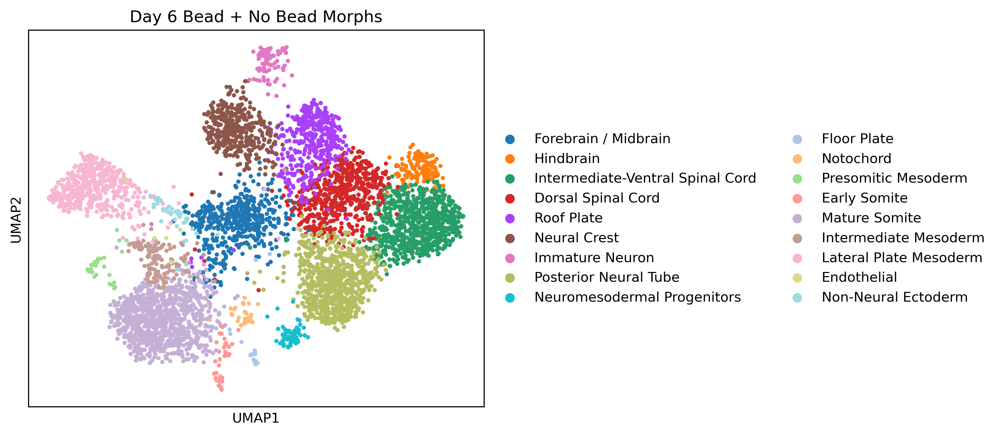

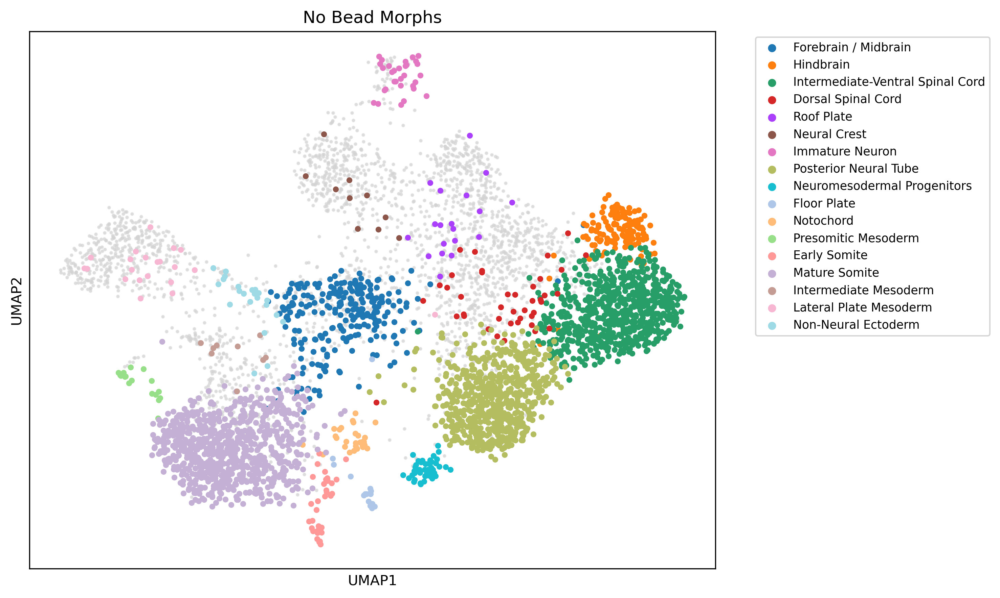

In [ ]:
with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    umap = adata_morph_SMD_.obsm["X_umap"]
    sample_A = adata_morph_SMD_.obs["source"] == "No Bead Morph"
    sample_B = adata_morph_SMD_.obs["source"] == "BMP4 Bead Morph"

    # Get cluster names and corresponding scanpy-assigned colors
    cluster_names = adata_morph_SMD_.obs["leiden_morph"].cat.categories
    cluster_colors_raw = adata_morph_SMD_.uns["leiden_morph_colors"]
    cluster_color_map = dict(zip(cluster_names, cluster_colors_raw))

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot sample B in gray
    ax.scatter(
        umap[sample_B, 0],
        umap[sample_B, 1],
        c="lightgray",
        s=2.5,
        alpha=0.6,
        # label="No Bead Morph"
    )

    # Plot sample A in original colors
    for cluster in cluster_names:
        idx = (adata_morph_SMD_.obs["leiden_morph"] == cluster) & sample_A
        if idx.any():
            ax.scatter(
                umap[idx, 0],
                umap[idx, 1],
                c=[cluster_color_map[cluster]],
                s=10,
                label=f"{cluster}",
            )

    # Clean up
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title("No Bead Morphs")
    ax.legend(
        markerscale=1.5, fontsize="small", bbox_to_anchor=(1.05, 1), loc="upper left"
    )

    plt.tight_layout()
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_nobead.png",
        bbox_inches="tight",
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_nobead.pdf",
        format="pdf",
        bbox_inches="tight",
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_nobead.svg",
        format="svg",
        bbox_inches="tight",
    )
    plt.show()

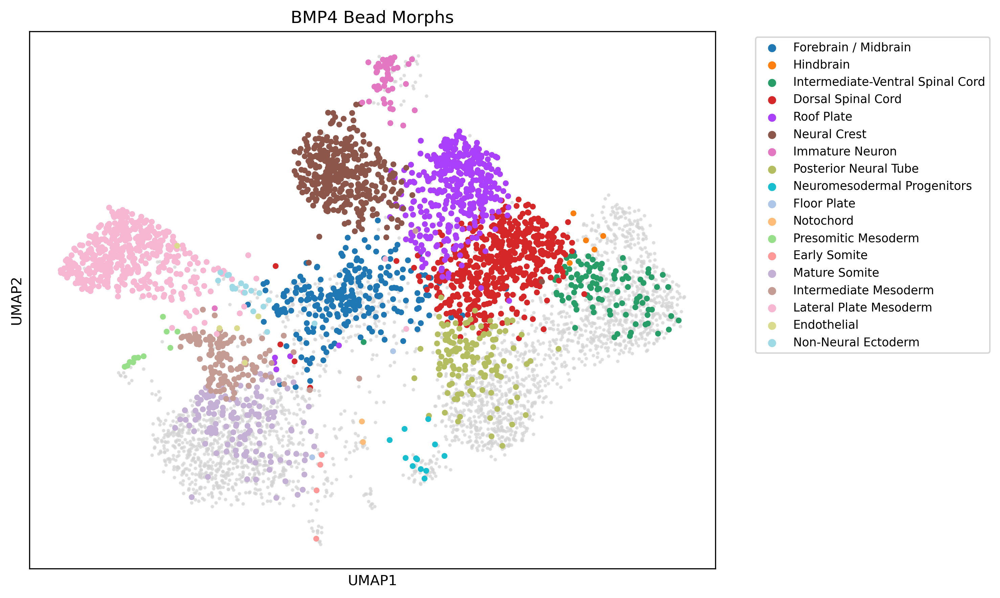

In [ ]:
with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    umap = adata_morph_SMD_.obsm["X_umap"]
    sample_A = adata_morph_SMD_.obs["source"] == "BMP4 Bead Morph"
    sample_B = adata_morph_SMD_.obs["source"] == "No Bead Morph"

    # Get cluster names and corresponding scanpy-assigned colors
    cluster_names = adata_morph_SMD_.obs["leiden_morph"].cat.categories
    cluster_colors_raw = adata_morph_SMD_.uns["leiden_morph_colors"]
    cluster_color_map = dict(zip(cluster_names, cluster_colors_raw))

    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot sample B in gray
    ax.scatter(
        umap[sample_B, 0],
        umap[sample_B, 1],
        c="lightgray",
        s=2.5,
        alpha=0.6,
        # label="No Bead Morph"
    )

    # Plot sample A in original colors
    for cluster in cluster_names:
        idx = (adata_morph_SMD_.obs["leiden_morph"] == cluster) & sample_A
        if idx.any():
            ax.scatter(
                umap[idx, 0],
                umap[idx, 1],
                c=[cluster_color_map[cluster]],
                s=10,
                label=f"{cluster}",
            )

    # Clean up
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title("BMP4 Bead Morphs")
    ax.legend(
        markerscale=1.5, fontsize="small", bbox_to_anchor=(1.05, 1), loc="upper left"
    )

    plt.tight_layout()
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_bead.png",
        bbox_inches="tight",
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_bead.pdf",
        format="pdf",
        bbox_inches="tight",
    )
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4b_umap_bead.svg",
        format="svg",
        bbox_inches="tight",
    )
    plt.show()

In [ ]:
with plt.rc_context({"figure.figsize": (6, 5), "figure.dpi": EXPORT_DPI}):
    sc.pl.umap(
        adata_morph_SMD_,
        color="source",
        palette=["#EF9A9A", "#92C5DE"],  # blue, red
        size=40,
        title="Day 6 Bead + No Bead Morphs",
        show=False,
        # save="_morphtype.pdf",
    )
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6a_umap_protocols.pdf",
        bbox_inches="tight",
        pad_inches=0,
    )

In [ ]:
import matplotlib.ticker as mtick

# 1) Make sure 'source' is categorical and set/reuse the same colors as your UMAP
src = adata_morph_SMD_.obs["source"].astype("category")
adata_morph_SMD_.obs["source"] = src
cats = list(src.cat.categories)

# If UMAP already set these, reuse them; otherwise define them here
if "source_colors" in adata_morph_SMD_.uns:
    source_palette_colors = list(adata_morph_SMD_.uns["source_colors"])
else:
    # same pair as before (blue, red), in the *category order*
    # adjust the mapping keys if your labels differ
    palette = {"Bead": "#92C5DE", "No Bead": "#EF9A9A"}
    source_palette_colors = [palette.get(c, "#999999") for c in cats]
    adata_morph_SMD_.uns["source_colors"] = source_palette_colors

with plt.rc_context({"figure.dpi": EXPORT_DPI, "figure.figsize": (6, 4)}):
    fig, ax = plt.subplots()

    # 2) Crosstab → rows = clusters, columns = source (after .T)
    tab = pd.crosstab(
        adata_morph_SMD_.obs["source"],
        adata_morph_SMD_.obs["leiden_morph"],
        normalize="columns",
    ).T

    # 3) Ensure columns are in the exact categorical order so colors align
    tab = tab.reindex(columns=cats)

    # 4) Plot with the exact same colors as the UMAP
    tab.plot(kind="bar", stacked=True, ax=ax, color=source_palette_colors, width=0.9)

    ax.set_ylabel("Fraction of cells")
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    ax.legend(title="Source", bbox_to_anchor=(1.25, 1.02), loc="upper left")

    fig.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6c_stackedbar_cluster_composition_by_protocol.pdf",
        bbox_inches="tight",
    )

## Fig. 4a, ED Fig. 6d - Key gene expression heatmap


In [ ]:
# Manually selected key genes associated with cell fate identities, based on dataset expression and developmental biology literature.
# Some antiquated genes are commented out. The same genes are used to analyze human embryo expression data in the heatmap in Fig. 4e.
integration_gene_panel = [
    # FOREBRAIN
    "FZD5",
    "RAX",
    "SIX6",
    "SIX3",
    "LINC01833",
    "FEZF1",
    "FOXG1",
    "LHX2",
    "OTX2",
    "POU3F1",
    # HINDBRAIN
    "PBX3",
    "CRABP1",
    "HOXA2",
    # "NR2F1",
    "GNG2",
    # "NAV2",
    # "MID1",
    # "HOXB-AS1",
    # "ILDR2",
    "EGR2",
    # VENTRAL SPINAL CORD
    "ROBO2",
    "NRXN1",
    "FGF13",
    # "PARD3B",
    "RGS20",
    # "LRIG1",
    # "NCALD",
    "CLIP1",
    "RNF220",
    # "CD47",
    # "CTNND2",
    "NTRK2",
    # "EPHB2",
    "RARB",
    # "LGR4",
    # "FZD7",
    "PTCH1",
    # dorsal spinal cord
    # "RGMA",
    "HES5",
    "PAX6",
    "FGFBP3",
    "SOX3",
    "SOX2",
    "TTYH1",
    "RFX4",
    "PANTR1",
    "POU3F2",
    "FIGN",
    "SFRP1",
    "NES",
    "VCAN",
    "IGDCC3",
    "WLS",
    "CNPY2",
    "ID1",
    "ID2",
    "CRNDE",
    "IRX3",
    "SALL2",
    "SRGAP3",
    "KIF21A",
    "GPM6B",
    "HES4",
    "SFRP2",
    "CDH2",
    "PAX3",
    "OLIG3",
    "CASZ1",
    "MSX2",
    "ZIC1",
    "ZIC2",
    "MSX1",
    "LMX1A",
    "WNT3A",
    # "TPBG",
    # neural crest
    "PAX7",
    "PLP1",
    "FOXD3-AS1",
    "FOXD3",
    "SCRG1",
    "LINC01198",
    "S100B",
    "ERBB3",
    "SOX10",
    "MPZ",
    "EDNRA",
    "SOX9",
    "SNAI2",
    # "L1TD1",
    "TFAP2A",
    "TFAP2B",
    # "MMP17",
    # "PLAT",
    # "MEF2C",
    "NPR3",
    # NEURON MARKERS
    "MAP2",
    "FNDC5",
    "NTRK1",
    "AFAP1",
    "DCC",
    # "SCRT2",
    # "LINC00599",
    "ST18",
    "ONECUT1",
    "CHGA",
    # "SEPTIN4",
    # "ADAMTS5",
    "CHRNA1",
    # "ANK1",
    "P2RX3",
    "DRD2",
    "OTP",
    "FGF14",
    "SVOP",
    # "VSTM2B",
    "PRDM12",
    # "SUSD2",
    # "USP18",
    # "CDKN1C",
    # "GADD45G",
    "HES6",
    # "VXN",
    "VSX1",
    "MFNG",
    "IGFBPL1",
    "NEUROG2",
    "PRMT8",
    # "TRABD2A",
    # "SYNDIG1",
    # "DGKB",
    "FRRS1L",
    "SNCAIP",
    # "CDH7",
    # "ZNF385D",
    # "OLFM1",
    "SNCG",
    "TAGLN3",
    "ELAVL2",
    # "KLHL35",
    "ONECUT2",
    "SCG3",
    "NEFM",
    "DCX",
    "ELAVL3",
    "STMN2",
    "INA",
    "TUBB3",
    "SRRM4",
    "RASD1",
    "INSM1",
    "NHLH1",
    "NEUROD1",
    "PPP1R17",
    "NEUROD4",
    "NEUROG1",
    # posterior neural tube
    "HOXA9",
    "HOXC9",
    "HOXC8",
    "HOXC6",
    "HOXB-AS3",
    "HOXB9",
    "HOXB3",
    "LINC02381",
    "HOXD3",
    "HOXB7",
    "C3orf52",
    "HOXA-AS3",
    "CDX4",
    "CDX2",
    "URAD",
    "LYPD6B",
    "FGF8",
    "GMPR",
    "WNT5A",
    # notochord
    "TBXT",
    "RAB3B",
    "PPP1R14C",
    "ITM2A",
    "TFF3",
    "FOXA1",
    "FOXA2",
    "SHH",
    "MNX1",
    "NOTO",
    "SAMD3",
    "CHRD",
    "EGF",
    "SPP1",
    "RARRES2",
    # "CGNL1",
    # "CCDC141",
    # "DENND2C",
    # "FLT4",
    # "CDH10",
    # "DYNC1I1",
    # presomitic mesoderm
    "MSGN1",
    # early somite
    # "RFTN1",
    "DLL3",
    "HES7",
    # "PRL",
    "RIPPLY1",
    "MEOX1",
    "RIPPLY2",
    "SSTR2",
    # "XKR4",
    "FOXC2",
    "TCF15",
    "ARHGAP10",
    # "PLK2",
    # mature somite
    # "SEPTIN6",
    "SIX1",
    # "LRIG3",
    "FST",
    # "COLEC12",
    "PDGFRA",
    "EYA2",
    "TWIST1",
    # "PCOLCE",
    # "COL1A2",
    "FLRT2",
    # "GMDS",
    "FOXC1",
    "FOXD1",
    "PAX9",
    "UNCX",
    "MEOX2",
    # "MARCH3",
    # "SMOC1",
    # "BST2",
    "IGFBP5",
    "LAMB1",
    "CREB3L2",
    "SULF1",
    "MEGF10",
    # "LOX",
    # "COL23A1",
    "ETS1",
    # Intermediate mesoderm
    "WT1",
    "PAX8",
    "PAX2",
    "ITGA8",
    "OSR1",
    # Lateral Plate Mesoderm
    "PITX1",
    "GATA6",
    "GATA6-AS1",
    "HAND1",
    "HAND2",
    "TNNI1",
    "TNNT2",
    "RBM20",
    "RYR2",
    "ALPK2",
    "TMEM88",
    "IGF2",
    "RGS5",
    "BAMBI",
    "LIX1",
    "PCDH7",
    "RUNX1T1",
    "CTTNBP2",
    "FAM89A",
    "ATF7IP2",
    "WWTR1",
    "ARHGAP28",
    "DLC1",
    "ARHGAP29",
    "DDR2",
    "PRRX1",
    "LUM",
    "COL3A1",
    "COL1A1",
    "SOX6",
    # "NID2",
    "COL6A3",
    "COL6A2",
    # "Z97200.1",
    "ALX4",
    "SVEP1",
    # "GLT8D2",
    # Non-neural ectoderm
    "S100A10",
    "KRT19",
    "KRT8",
    "KRT18",
    "CDH1",
    "CLDN6",
    "CLDN7",
    "EPCAM",
    # "VGLL1",
    "KRT7",
    "WNT6",
    "MIR205HG",
    "TACSTD2",
    "STOM",
    "GATA3",
    # "DOK4",
    "GRHL1",
    # "ADAM28",
    "GRHL2",
    "PRDM1",
]

In [ ]:
# Selected subset of genes in list integration_gene_panel to label explicitly on Fig. 4a, e
fig4_heatmap_label_genes = [
    # forebrain / midbrain
    "OTX2",
    # "FOXG1",
    "SIX3",
    # "RAX",
    "LHX2",
    # "FEZF1",
    # "SIX6",
    # hindbrain
    "CRABP1",
    "HOXA2",
    "EGR2",
    # # ventral spinal cord
    "RNF220",
    # "RGS20",
    # "FGF13",
    "PTCH1",
    # dorsal spinal cord
    "LMX1A",
    "WNT3A",
    # "ZIC1",
    "ZIC2",
    "MSX1",
    # "MSX2",
    # "OLIG3",
    "IRX3",
    # "SFRP1",
    # "SFRP2",
    # "WNT3A",
    # "RFX4",
    # "HES4",
    "SOX2",
    # neural crest
    "PAX3",
    # "PAX7",
    "FOXD3",
    "SOX10",
    # "SOX9",
    "SNAI2",
    "TFAP2A",
    "TFAP2B",
    # "ERBB3",
    # "MPZ",
    # "S100B",
    # "EDNRA",
    # immature neurons
    # "MAP2",
    "TUBB3",
    # "DCX",
    # "NEFM",
    # "ELAVL2",
    "ELAVL3",
    "STMN2",
    # "INA",
    # "SVOP",
    # "SNCG",
    # posterior neural tube
    "CDX2",
    "CDX4",
    "HOXA9",
    # "HOXB9",
    # "HOXC9",
    # "HOXC8",
    # "HOXC6",
    "HOXB3",
    "HOXD3",
    # NMPs
    "TBXT",
    "FGF8",
    # notochord
    "NOTO",
    # "SHH",
    # "MNX1",
    # presomitic mesoderm
    "MSGN1",
    # early somite
    # "DLL3",
    "TCF15",
    "MEOX1",
    "RIPPLY1",
    # "RIPPLY2",
    # "HES7",
    "FOXC2",
    # Mature Somite
    # "SIX1",
    # "EYA2",
    # "MEOX2",
    # "UNCX",
    # "PAX9",
    # "PDGFRA",
    "FOXC1",
    # "FOXD1",
    # "TWIST1",
    # IM
    # "WT1",
    # "PAX2",
    "PAX8",
    # "OSR1",
    "ITGA8",
    # LPM
    "HAND1",
    # "HAND2",
    # "GATA6",
    "TMEM88",
    "PRRX1",
    # "ALX4",
    # "SVEP1",
    # "TNNI1",
    # "TNNT2",
    # "RYR2",
    # "PITX1",
    # # NNE
    # "KRT8",
    # "KRT18",
    # "KRT19",
    "GRHL2",
    # "GRHL1",
    # "KRT7",
    "CDH1",
    # "CLDN6",
    # "CLDN7",
    # "EPCAM",
    # "TACSTD2",
    # "GATA3",
]

In [ ]:
adata_morph_embryo_gene_subset = adata_morph_with_clusters[
    :,
    resolve_symbols(
        adata_morph_with_clusters,
        integration_gene_panel,
        strict=False,
        allow_missing=True,
    ),
].copy()

In [ ]:
trunk_cell_order = []
# adata_morph_embryo_gene_subset = adata_morph_SMD_2[ :].copy()
adata_morph_embryo_gene_subset.obs.loc[lpm_endothelial_cell_ids, "leiden_morph"] = (
    "Endothelial"
)
trunk_cell_order = ordered_cells_by_cluster_clustermap(
    adata=adata_morph_embryo_gene_subset,
    cluster_key="leiden_morph",
    var_names=integration_gene_panel,
    figsize=(7, 7),
    vmin=0,
    vmax=5,
    cmap=batlow,
    method="average",
    metric="jensenshannon",
)


In [ ]:
# Manual Cell Order correction for hierarchial clustering within cluster, to emphasize substructure
adata_morph_sorted = adata_morph_embryo_gene_subset[trunk_cell_order, :].copy()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


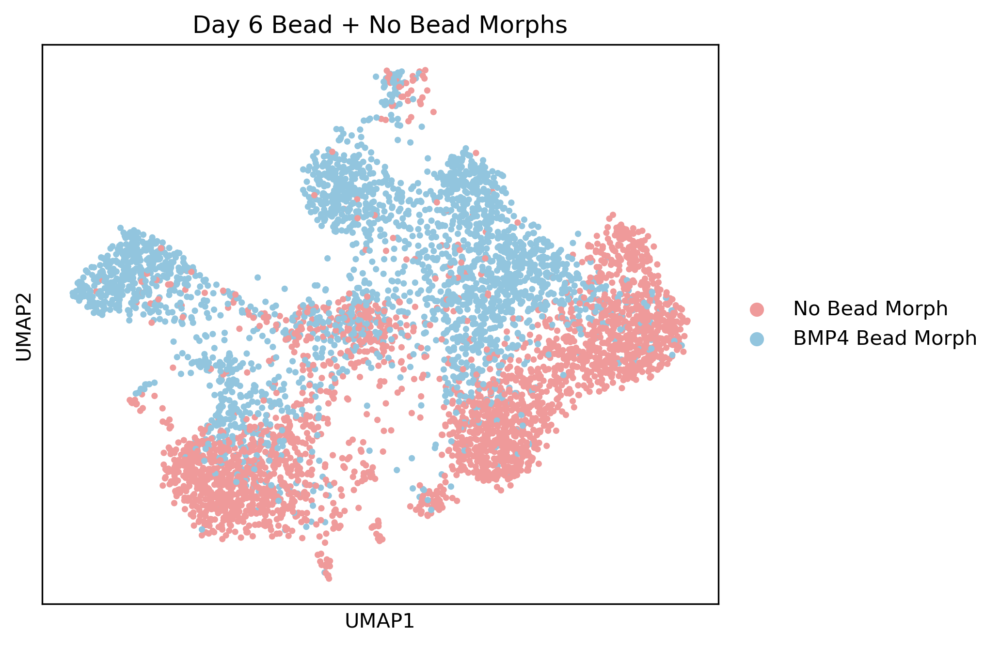

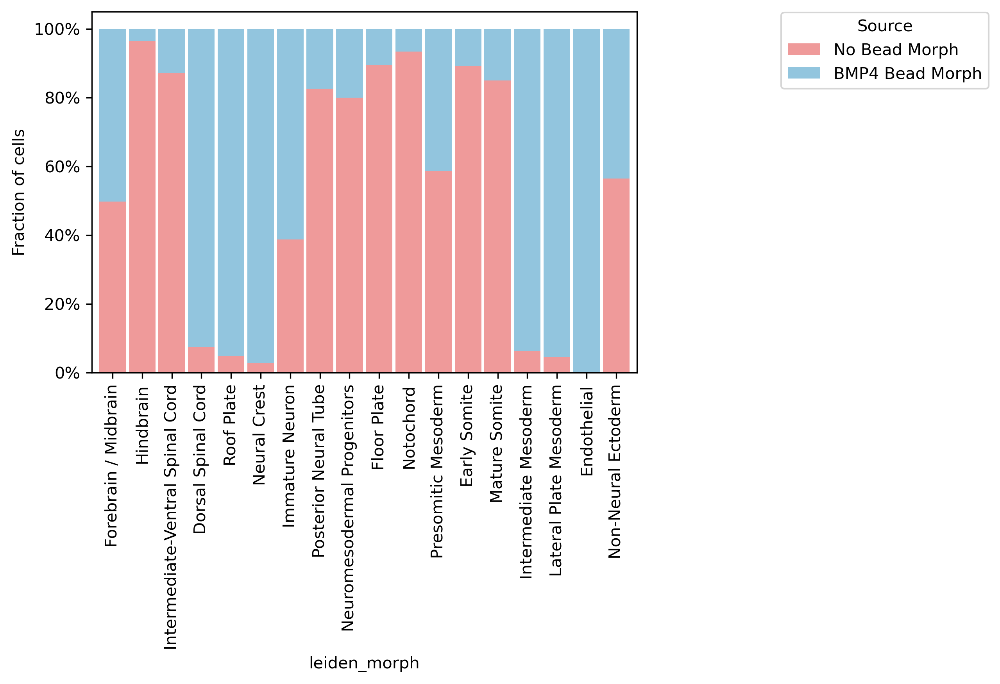

In [ ]:
# Plot no bead trunk morph expression heatmap PNG for visual check
with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    ax = sc.pl.heatmap(
        adata_morph_sorted[adata_morph_sorted.obs.source == "No Bead Morph", :],
        var_names=adata_morph_sorted[
            adata_morph_sorted.obs.source == "No Bead Morph", :
        ].var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )

    bold_selected_heatmap_yticklabels(
        ax, fig4_heatmap_label_genes
    )  # keep bold genes in Illustrator figure (manually delete other gene labels)
    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_nobead.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


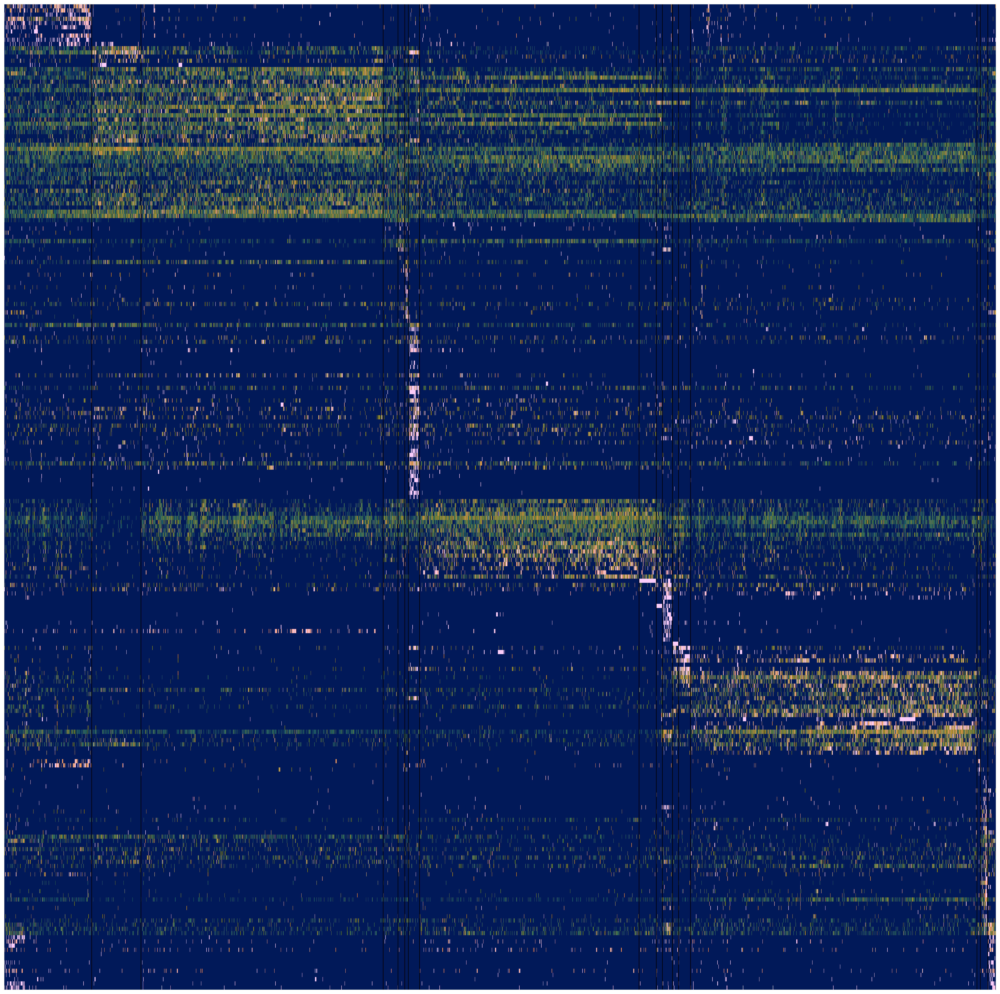

In [ ]:
# Plot no bead trunk morph expression heatmap data (no axes) as PNG for non-editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_sorted[adata_morph_sorted.obs.source == "No Bead Morph", :],
        var_names=adata_morph_sorted[
            adata_morph_sorted.obs.source == "No Bead Morph", :
        ].var_names,
        groupby="leiden_morph",
        swap_axes=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_nobead_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

In [ ]:
# Plot no bead trunk morph expression heatmap axes (no data) as SVG for editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):

    adata_morph_subset = adata_morph_sorted[
        adata_morph_sorted.obs.source == "No Bead Morph", :
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )
    keep_only_selected_heatmap_yticklabels(ax, fig4_heatmap_label_genes)

    ax["groupby_ax"].set_xlabel("")

    # Export as SVG
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_nobead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


In [ ]:
# Plot no bead trunk morph expression heatmap axes (no data) as PDF for editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):

    adata_morph_subset = adata_morph_sorted[
        adata_morph_sorted.obs.source == "No Bead Morph", :
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        # save="-smd.png",
        show=False,
    )

    keep_only_selected_heatmap_yticklabels(ax, fig4_heatmap_label_genes)

    ax["groupby_ax"].set_xlabel("")

    # Export as PDF
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_nobead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


In [ ]:
# Plot bead trunk morph expression heatmap PNG, for visual check

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    ax = sc.pl.heatmap(
        adata_morph_sorted[adata_morph_sorted.obs.source == "BMP4 Bead Morph", :],
        var_names=adata_morph_sorted[
            adata_morph_sorted.obs.source == "BMP4 Bead Morph", :
        ].var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        # save="-smd.png",
        show=False,
    )

    bold_selected_heatmap_yticklabels(
        ax, fig4_heatmap_label_genes
    )  # keep bold genes in Illustrator figure (manually delete other gene labels)
    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_bead.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


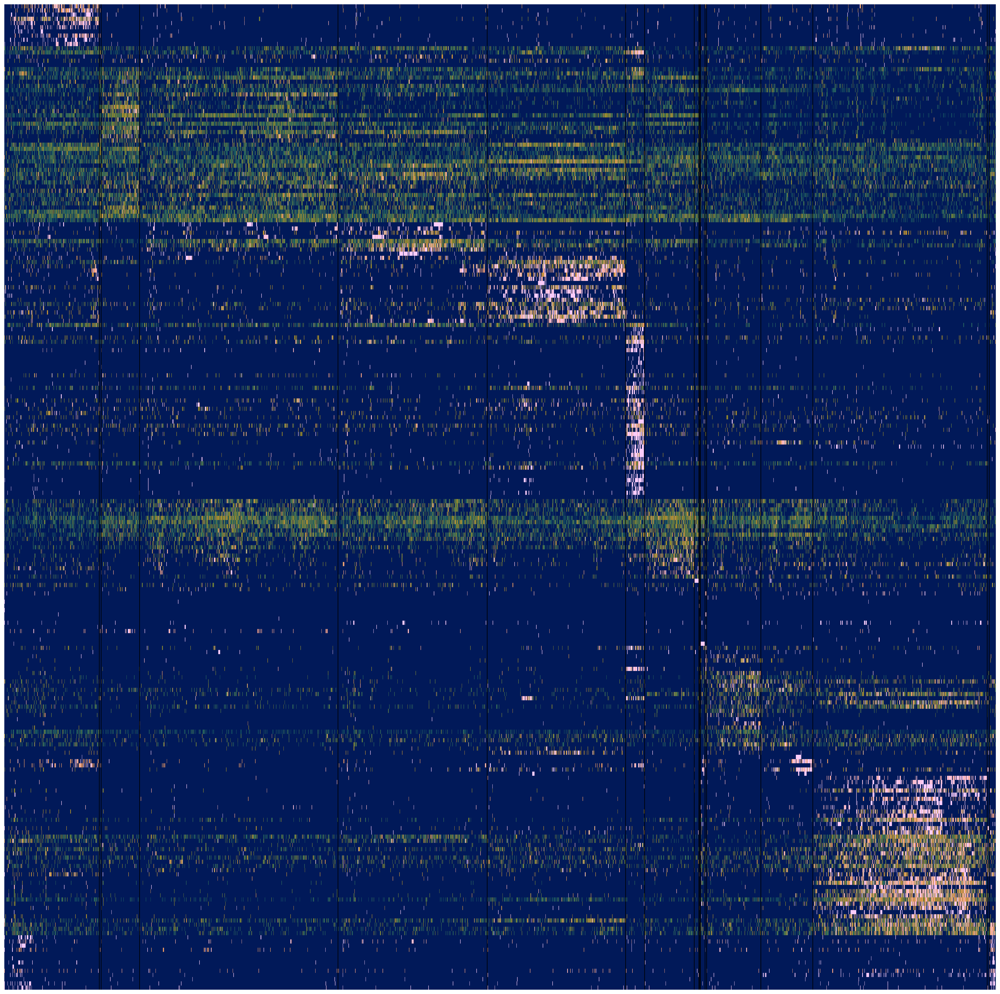

In [ ]:
# Plot bead trunk morph expression heatmap data (no axes) as PNG for non-editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_sorted[adata_morph_sorted.obs.source == "BMP4 Bead Morph", :],
        var_names=adata_morph_sorted.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_bead_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

In [ ]:
# Plot bead trunk morph expression heatmap axes (no data) as SVG for editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    adata_morph_subset = adata_morph_sorted[
        adata_morph_sorted.obs.source == "BMP4 Bead Morph", :
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )

    keep_only_selected_heatmap_yticklabels(ax, fig4_heatmap_label_genes)

    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_bead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


In [ ]:
# Plot bead trunk morph expression heatmap axes (no data) as PDF for editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    adata_morph_subset = adata_morph_sorted[
        adata_morph_sorted.obs.source == "BMP4 Bead Morph", :
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )

    keep_only_selected_heatmap_yticklabels(ax, fig4_heatmap_label_genes)

    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{MANUSCRIPT_FIG_DIR}/Fig4a_heatmap_key_genes_bead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


## Calculate DEGs per cluster
DEGs - differentially expressed genes, ranked by multinomial logistic regression


In [ ]:
# Calculate top 100 DEGs per cluster, among all genes, by multinomial logistic regression (only positively enriched genes)
sc.tl.rank_genes_groups(
    adata_morph_with_clusters,
    groupby="leiden_morph",
    method="logreg",
    rankby_abs=False,
    max_iter=1000,
    multi_class="multinomial",
    key_added="multi",
)
DEGs_morph_multi = pd.DataFrame(adata_morph_with_clusters.uns["multi"]["names"][0:100])
DEGscores_morph_multi = pd.DataFrame(
    adata_morph_with_clusters.uns["multi"]["scores"][0:100]
)

/opt/anaconda3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:645: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


### Supp. Data 1 - Top 100 DEGs and scores per cluster


In [ ]:
# For copy-paste into excel spreadsheet
# Supplementary Data 1 - "Gene markers and differential expression supporting trunk morph cell type annotations"
# Sheet 4 "DEGs"
supp_data1_main_wide = (
    pd.concat([DEGs_morph_multi, DEGscores_morph_multi], axis=1, keys=["gene", "score"])
    .swaplevel(0, 1, axis=1)
    .reindex(
        columns=pd.MultiIndex.from_product(
            [DEGs_morph_multi.columns, ["gene", "score"]]
        )
    )
)
supp_data1_main_wide

### ED Fig. 6 - Expression heatmap for top 5 DEGs per cluster


In [ ]:
# Find top 5 differentially expressed genes per cluster (multinomial logistic regression)
# Each gene is associated with at most one cluster (with its maximum regression score)
max_genes_considered = 5
genes_considered = []

for j in range(len(DEGs_morph_multi.columns)):
    col = DEGs_morph_multi.columns[j]
    ii = 0
    adata_cluster = adata_morph_raw[
        adata_morph_with_clusters.obs_names[
            adata_morph_with_clusters.obs.leiden_morph == col
        ],
        DEGs_morph_multi[col].values,
    ]

    for g in DEGs_morph_multi[col].values:
        if ii >= max_genes_considered:
            break

        # only use gene for cluster where it's DEG score is maximum
        if DEGscores_morph_multi[DEGs_morph_multi == g].sum().idxmax() == col:
            if (adata_cluster[:, g].X > 1).sum() > 4:
                genes_considered.append(g)
                ii += 1

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


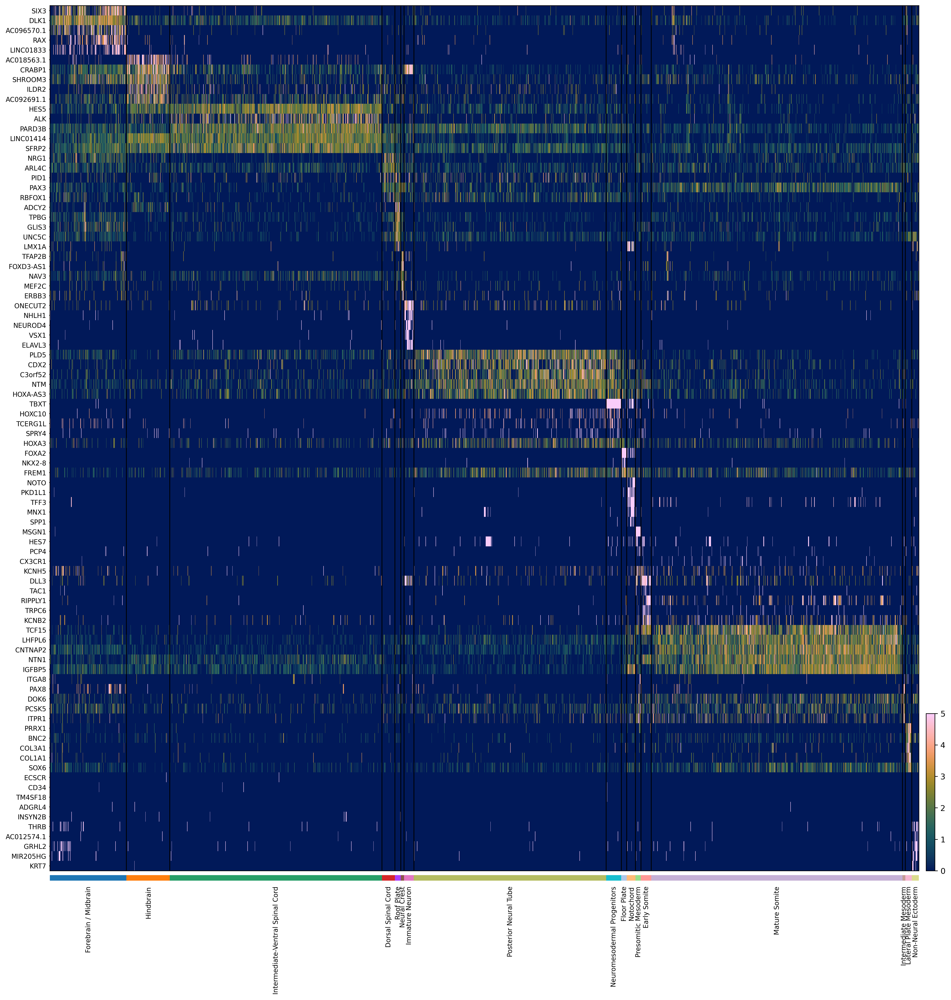

In [ ]:
# Plot no bead heatmap PDF, for visual check

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    ax = sc.pl.heatmap(
        adata_morph_with_clusters[trunk_cell_order, genes_considered][
            adata_morph_with_clusters.obs.source == "No Bead Morph"
        ],
        var_names=genes_considered,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(20, 20),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_nobead.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


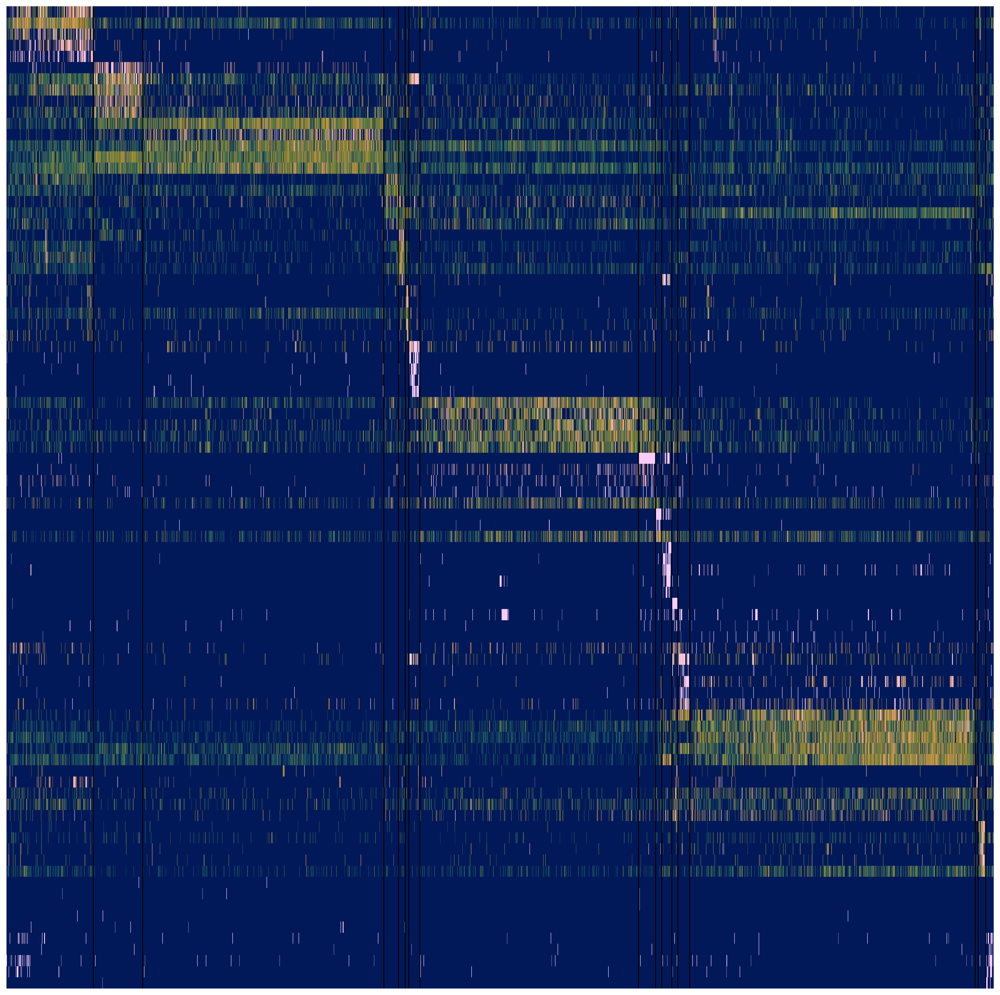

In [ ]:
# Plot no bead heatmap data (no axes) as PNG for non-editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_with_clusters[trunk_cell_order, genes_considered][
            adata_morph_with_clusters.obs.source == "No Bead Morph"
        ],
        var_names=genes_considered,
        groupby="leiden_morph",
        swap_axes=True,
        figsize=(20, 20),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_nobead_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

In [ ]:
# Plot no bead heatmap axes (no data) as SVG for editable import in Illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):

    adata_morph_subset = adata_morph_with_clusters[trunk_cell_order, genes_considered][
        adata_morph_with_clusters.obs.source == "No Bead Morph"
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )

    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_nobead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


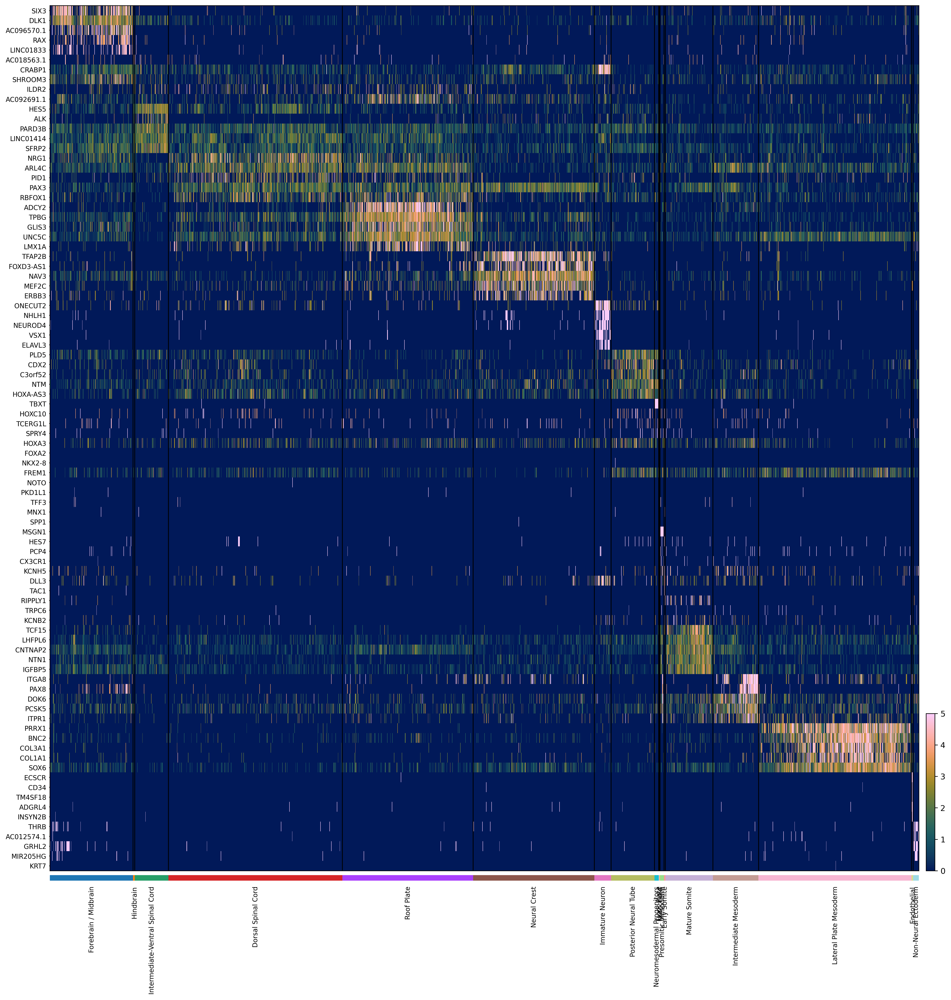

In [ ]:
# Plot bead heatmap PDF, for visual check

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    ax = sc.pl.heatmap(
        adata_morph_with_clusters[trunk_cell_order, genes_considered][
            adata_morph_with_clusters.obs.source == "BMP4 Bead Morph"
        ],
        var_names=genes_considered,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(20, 20),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    ax["groupby_ax"].set_xlabel("")
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_bead.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:
/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


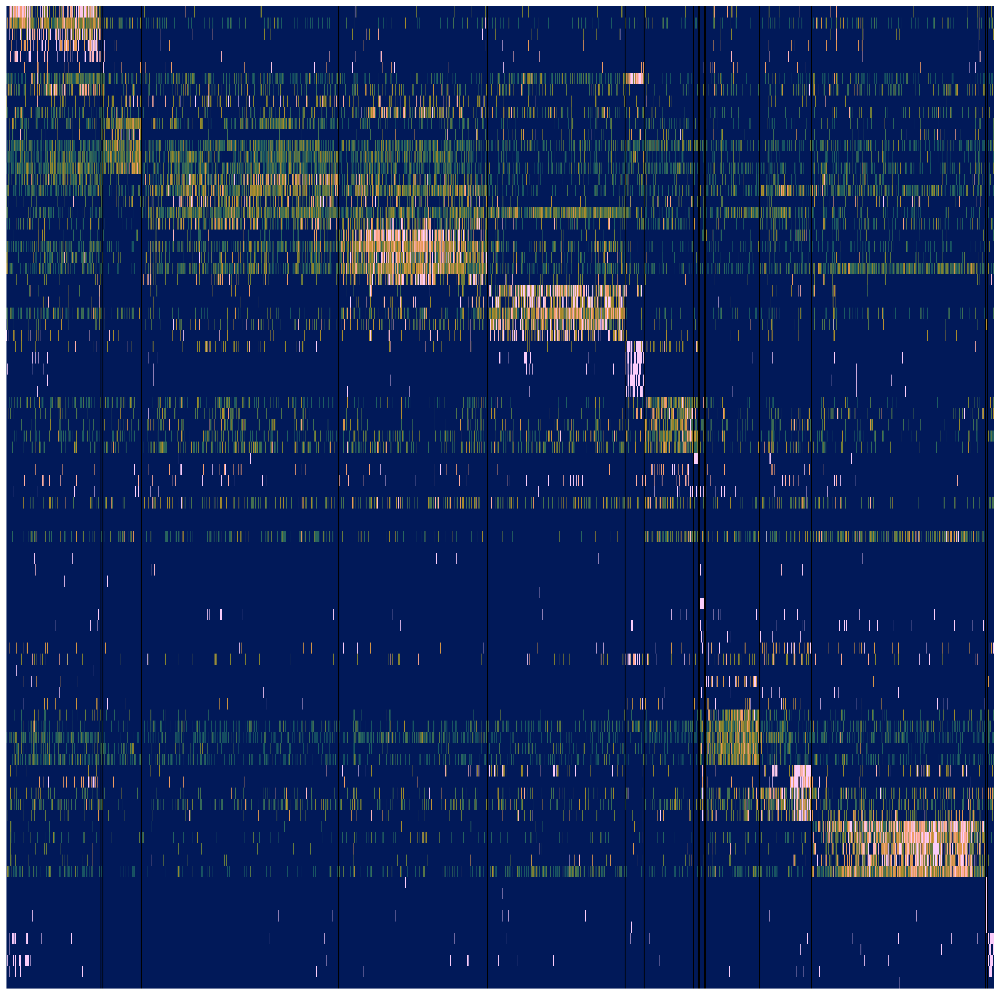

In [ ]:
# Plot bead heatmap data (no axes) as PNG for non-editable import in illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):
    fig_dict = sc.pl.heatmap(
        adata_morph_with_clusters[trunk_cell_order, genes_considered][
            adata_morph_with_clusters.obs.source == "BMP4 Bead Morph"
        ],
        var_names=genes_considered,
        groupby="leiden_morph",
        swap_axes=True,
        figsize=(20, 20),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
        var_group_labels=[],
    )

    hide_heatmap_axes_and_colorbar(fig_dict)

    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_bead_noaxes.png",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

In [ ]:
# Plot bead heatmap axes (no data) as SVG for editable import in Illustrator

with plt.rc_context({"figure.dpi": EXPORT_DPI}):

    adata_morph_subset = adata_morph_with_clusters[trunk_cell_order, genes_considered][
        adata_morph_with_clusters.obs.source == "BMP4 Bead Morph"
    ].copy()

    ax = plot_empty_heatmap_axes(
        adata_morph_subset,
        var_names=adata_morph_subset.var_names,
        groupby="leiden_morph",
        swap_axes=True,
        show_gene_labels=True,
        figsize=(30, 30),
        vmin=0,
        vmax=5,
        cmap=batlow,
        show=False,
    )

    # Export as SVG
    plt.savefig(
        f"{EXTENDED_FIG_DIR}/EDFig6e_heatmap_top5degs_bead_axesonly.svg",
        bbox_inches="tight",
        pad_inches=0,
    )
    plt.show()

/opt/anaconda3/lib/python3.12/site-packages/scanpy/plotting/_anndata.py:2035: FutureWarning: Use obs (e.g. `k in adata.obs` or `str(adata.obs.columns.tolist())`) instead of AnnData.obs_keys, AnnData.obs_keys is deprecated and will be removed in the future.
  if group not in list(adata.obs_keys()) + [adata.obs.index.name]:


## Save Stage Outputs
Persist processed `AnnData` objects, the raw full-gene SMD z-score lookup table, and an explicit final gene-selection table that records thresholding plus manual overrides under the promoted FOXA2-inclusive medoid clustering configuration.


In [ ]:
stage_path = stage_dir(RESULTS_DIR, "02_trunk_main")
save_h5ad(adata_morph_with_clusters, stage_path / "adata_morph_with_clusters.h5ad")
save_h5ad(adata_morph_SMD_, stage_path / "adata_morph_SMD_.h5ad")
save_h5ad(
    adata_morph_embryo_gene_subset, stage_path / "adata_morph_embryo_gene_subset.h5ad"
)
for _adata in [
    adata_morph_with_clusters,
    adata_morph_SMD_,
    adata_morph_embryo_gene_subset,
    adata_morph_SMD,
]:
    assert_gene_id_index(_adata)

save_h5ad(adata_morph_SMD, stage_path / "adata_morph_SMD.h5ad")

morph_smd_gene_scores = pd.DataFrame(
    {
        "gene_ids": adata_morph_filtered.var_names.astype(str),
        "gene_symbol": adata_morph_filtered.var["gene_symbol"].astype(str).to_numpy(),
        "gene_symbol_original": adata_morph_filtered.var["gene_symbol_original"].astype(str).to_numpy(),
        "z_score_SMD": adata_morph_filtered.var["z_score_SMD"].to_numpy(),
        "log1p_z_score_SMD": adata_morph_filtered.var["log1p_z_score_SMD"].to_numpy(),
        "selected_at_z_gt_2": (adata_morph_filtered.var["z_score_SMD"].to_numpy() > 2),
        "selected_at_z_gt_current": (
            adata_morph_filtered.var["z_score_SMD"].to_numpy() > morph_z_threshold
        ),
        "z_threshold_current": morph_z_threshold,
        "smd_run_id": selected_trunk_smd_run,
        "smd_run_n_sub": trunk_smd_run_n_sub[selected_trunk_smd_run],
    }
)
save_pickle(morph_smd_gene_scores, stage_path / "trunk_morph_smd_gene_scores.pkl")
morph_smd_gene_scores.to_csv(
    stage_path / "trunk_morph_smd_gene_scores.csv", index=False
)

selection_gene_ids = list(adata_morph_filtered.var_names.astype(str))
selection_gene_id_set = set(selection_gene_ids)
for extra_ids in [morph_manual_add_ids, morph_manual_remove_ids, cellcycle_gene_ids]:
    for gene_id in extra_ids:
        gene_id = str(gene_id)
        if gene_id not in selection_gene_id_set:
            selection_gene_ids.append(gene_id)
            selection_gene_id_set.add(gene_id)

selection_gene_index = pd.Index(selection_gene_ids, dtype="object")
selection_meta = adata_morph.var.reindex(selection_gene_index)
selection_scores = adata_morph_filtered.var.reindex(selection_gene_index)
final_gene_selection = pd.DataFrame(
    {
        "gene_ids": selection_gene_index.astype(str),
        "gene_symbol": selection_meta["gene_symbol"].astype("string").to_numpy(),
        "gene_symbol_original": selection_meta["gene_symbol_original"].astype("string").to_numpy(),
        "in_smd_scored_space": selection_gene_index.isin(adata_morph_filtered.var_names),
        "z_score_SMD": selection_scores["z_score_SMD"].to_numpy(),
        "log1p_z_score_SMD": selection_scores["log1p_z_score_SMD"].to_numpy(),
        "selected_at_z_gt_2": (
            selection_scores["z_score_SMD"].fillna(float("-inf")).to_numpy() > 2
        ),
        "selected_at_z_gt_current": (
            selection_scores["z_score_SMD"].fillna(float("-inf")).to_numpy()
            > morph_z_threshold
        ),
        "manually_added_to_final_smd": selection_gene_index.isin(morph_manual_add_ids),
        "manually_removed_from_final_smd": selection_gene_index.isin(
            morph_manual_remove_ids
        ),
        "removed_as_cell_cycle": selection_gene_index.isin(cellcycle_gene_ids),
        "included_in_final_smd_current": selection_gene_index.isin(
            adata_morph_SMD.var_names
        ),
        "z_threshold_current": morph_z_threshold,
        "smd_run_id": selected_trunk_smd_run,
        "smd_run_n_sub": trunk_smd_run_n_sub[selected_trunk_smd_run],
    }
)
save_pickle(
    final_gene_selection, stage_path / "trunk_morph_final_gene_selection.pkl"
)
final_gene_selection.to_csv(
    stage_path / "trunk_morph_final_gene_selection.csv", index=False
)

save_pickle(celltypeorder, stage_path / "celltypeorder.pkl")
save_pickle(integration_gene_panel, stage_path / "integration_gene_panel.pkl")
save_pickle(fig4_heatmap_label_genes, stage_path / "key_genes.pkl")
save_json(
    {
        "stage": "02_trunk_main",
        "selected_trunk_smd_run": selected_trunk_smd_run,
        "selected_trunk_smd_run_n_sub": trunk_smd_run_n_sub[selected_trunk_smd_run],
        "leiden_resolution": 1.55,
        "leiden_random_state": 5,
        "selection_rule": "medoid_raw_run_by_mean_ari",
        "selection_source": "leiden_ensemble 02_trunk_main representative run",
        "smd_z_threshold_current": morph_z_threshold,
        "manual_add_genes": morph_manual_smd_genes,
        "manual_remove_genes": morph_manual_remove_genes,
        "cell_cycle_remove_gene_count": len(cellcycle_gene_ids),
    },
    stage_path / "meta.json",
)
print(f"Saved trunk-main intermediates to {stage_path}")


Saved trunk-main intermediates to <analysis-root>/trunk_main_dev/results/intermediates/02_trunk_main
